# Import packages and define functions

In [1]:
import os
os.environ['MKL_NUM_THREADS'] = '1'
import numpy as np
import proper
from scipy.interpolate import interp1d
import astropy.io.fits as pyfits
from roman_phasec_proper import trim, mft2, ffts, polmap
import roman_phasec_proper

import astropy.units as u
import astropy.io.fits as fits
import misc

proper.prop_use_fftw()
proper.prop_fftw_wisdom(2048)

###############################################################################33
def radius( n ):
    x = np.arange( n ) - int(n)//2
    r = np.sqrt( x*x + x[:,np.newaxis]**2 )
    return r

###############################################################################33
def angle( n ):
    x = np.arange( n ) - int(n)//2
    return np.arctan2( x[:,np.newaxis], x ) * (180 / np.pi)

###############################################################################33
def glass_index( glass, lambda_m, data_dir ):
    a = np.loadtxt( data_dir + '/glass/' + glass+'_index.txt' )  # lambda_um index pairs
    f = interp1d( a[:,0], a[:,1], kind='cubic' )
    return f( lambda_m*1e6 )

###############################################################################33
def to_from_singlet( wavefront, dz_to_lens, dz_from_lens, r1, r2, thickness, nglass, 
    surface_name, next_surface_name, ERROR_MAP_FILE=' ', TO_PLANE=0):

    # single thick lens
    # r1, r2 = front & rear radii of curvature

    f = 1 / ( (nglass - 1) * ( 1.0/r1 - 1.0/r2 + (nglass - 1)*thickness / (nglass*r1*r2) ) )      # effective focal length
    h1 = -f*(nglass - 1)*thickness / (nglass*r2)    # front principal plane
    h2 = -f*(nglass - 1)*thickness / (nglass*r1)    # rear principal plane

    proper.prop_propagate( wavefront, dz_to_lens+h1, surface_name )
    proper.prop_lens( wavefront, f, surface_name )
    if ERROR_MAP_FILE != ' ': 
        proper.prop_errormap( wavefront, ERROR_MAP_FILE, WAVEFRONT=True )
    proper.prop_propagate( wavefront, -h2+dz_from_lens, next_surface_name, TO_PLANE=TO_PLANE )

    return

###############################################################################33
def to_from_doublet( wavefront, dz_to_lens, dz_from_lens, r1_a, r2_a, thickness_a, nglass_a, separation_m, 
    r1_b, r2_b, thickness_b, nglass_b, surface_name, next_surface_name, ERROR_MAP_FILE=' ', TO_PLANE=0, save_waves=False):

    # two air-gapped thick lenses (lenses a & b)

    f_a = 1 / ( (nglass_a - 1) * ( 1.0/r1_a - 1.0/r2_a + (nglass_a - 1)*thickness_a / (nglass_a*r1_a*r2_a) ) )
    h1_a = -f_a*(nglass_a - 1)*thickness_a / (nglass_a*r2_a)
    h2_a = -f_a*(nglass_a - 1)*thickness_a / (nglass_a*r1_a)
    print(f_a, h1_a, h2_a)
    
    f_b = 1 / ( (nglass_b - 1) * ( 1.0/r1_b - 1.0/r2_b + (nglass_b - 1)*thickness_b / (nglass_b*r1_b*r2_b) ) )
    h1_b = -f_b*(nglass_b - 1)*thickness_b / (nglass_b*r2_b)
    h2_b = -f_b*(nglass_b - 1)*thickness_b / (nglass_b*r1_b)
    print(f_b, h1_b, h2_b)
    print(dz_to_lens+h1_a, -h2_a+separation_m+h1_b, -h2_b+dz_from_lens)
    
    # PROPAGATE TO LENS 1
    proper.prop_propagate( wavefront, dz_to_lens+h1_a, surface_name )
    proper.prop_lens( wavefront, f_a, surface_name+' lens #1' )
    if ERROR_MAP_FILE != ' ':
#         proper.prop_errormap( wavefront, ERROR_MAP_FILE, WAVEFRONT=True )
        map_fname = 'roman_phasec_LENS_phase_error_V1.0.fits'
        dmap = proper.prop_errormap( wavefront, map_dir+map_fname, WAVEFRONT=True )
        sampling = proper.prop_get_sampling(wavefront)
        dmaphdr = fits.Header(); dmaphdr['PIXELSCL'] = sampling
        dmaphdu = fits.PrimaryHDU(data=dmap, header=dmaphdr)
        dmaphdu.writeto(map_dir_new+map_fname, overwrite=True)
        print(map_dir_new+map_fname, sampling)
    wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
    wf_phase = proper.prop_get_phase(wavefront)
    wf_sampling = proper.prop_get_sampling(wavefront)

    misc.myimshow2(wf_int, wf_phase, pxscl=wf_sampling*u.m/u.pix, lognorm1=True, vmin1=1e-15)
    if save_waves:
        wf = np.zeros(shape=(2,n,n))
        wf[0,:,:] = wf_int
        wf[1,:,:] = wf_phase

        wf_fname = 'wf_lens1'
        wf_fpath = wf_dir + wf_fname + '_proper' + '.fits'
        print(wf_fpath)
        hdr = fits.Header()
        hdr['PIXELSCL'] = wf_sampling

        wf_hdu = fits.PrimaryHDU(wf, header=hdr)
        wf_hdu.writeto(wf_fpath, overwrite=True)
    
    # PROPAGATE TO LENS 2
    proper.prop_propagate( wavefront, -h2_a+separation_m+h1_b )
    proper.prop_lens( wavefront, f_b, surface_name+' lens #2' )
    wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
    wf_phase = proper.prop_get_phase(wavefront)
    wf_sampling = proper.prop_get_sampling(wavefront)

    misc.myimshow2(wf_int, wf_phase, pxscl=wf_sampling*u.m/u.pix, lognorm1=True, vmin1=1e-15)
    if save_waves:
        wf = np.zeros(shape=(2,n,n))
        wf[0,:,:] = wf_int
        wf[1,:,:] = wf_phase

        wf_fname = 'wf_lens2'
        wf_fpath = wf_dir + wf_fname + '_proper' + '.fits'
        print(wf_fpath)
        hdr = fits.Header()
        hdr['PIXELSCL'] = wf_sampling

        wf_hdu = fits.PrimaryHDU(wf, header=hdr)
        wf_hdu.writeto(wf_fpath, overwrite=True)
    
    # PROPAGATE TO IMAGE
    proper.prop_propagate( wavefront, -h2_b+dz_from_lens, next_surface_name, TO_PLANE=TO_PLANE )
    wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
    wf_phase = proper.prop_get_phase(wavefront)
    wf_sampling = proper.prop_get_sampling(wavefront)

    misc.myimshow2(wf_int, wf_phase, pxscl=wf_sampling*u.m/u.pix, lognorm1=True, vmin1=1e-15)
    if save_waves:
        wf = np.zeros(shape=(2,n,n))
        wf[0,:,:] = wf_int
        wf[1,:,:] = wf_phase

        wf_fname = 'wf_image'
        wf_fpath = wf_dir + wf_fname + '_proper' + '.fits'
        print(wf_fpath)
        hdr = fits.Header()
        hdr['PIXELSCL'] = wf_sampling

        wf_hdu = fits.PrimaryHDU(wf, header=hdr)
        wf_hdu.writeto(wf_fpath, overwrite=True)
    return

Computing wisdom for 4 threads
Computing wisdom for 1 threads


In [2]:
pupil_array = 0             # 2D array containing pupil pattern (overrides default)
pupil_mask_array = 0        # 2D array containing SPC pupil mask pattern (overrides default)
fpm_array = 0               # 2D array containing FPM mask pattern (overrides default)
fpm_mask = 0                # 2D array where 1=FPM pattern defined, 0=substrate
lyot_stop_array = 0         # 2D array containing Lyot stop mask pattern (overrides default)
field_stop_array = 0        # 2D array containing field stop mask pattern (overrides default)

cor_type = 'hlc'            # coronagraph type ('hlc', 'spc-spec_band2', 'spc-spec_band3', 'spc-wide', 'none')
source_x_offset_mas = 0     # source offset in mas (tilt applied at primary)
source_y_offset_mas = 0                 
source_x_offset = 0         # source offset in lambda0_m/D radians (tilt applied at primary)
source_y_offset = 0                 
polaxis = 0                 # polarization axis aberrations: 
                            #    -2 = -45d in, Y out 
                            #    -1 = -45d in, X out 
                            #     1 = +45d in, X out 
                            #     2 = +45d in, Y out 
                            #     5 = mean of modes -1 & +1 (X channel polarizer)
                            #     6 = mean of modes -2 & +2 (Y channel polarizer)
                            #    10 = mean of all modes (no polarization filtering)
use_errors = 1              # use optical surface phase errors? 1 or 0 
zindex = np.array([0,0])    # array of Zernike polynomial indices
zval_m = np.array([0,0])    # array of Zernike coefficients (meters RMS WFE)
sm_despace_m = 0            # secondary mirror despace (meters) 
use_pupil_defocus = 1       # include pupil defocus
use_aperture = 0            # use apertures on all optics? 1 or 0
cgi_x_shift_pupdiam = 0     # X,Y shear of wavefront at FSM (bulk displacement of CGI); normalized relative to pupil diameter
cgi_y_shift_pupdiam = 0          
cgi_x_shift_m = 0           # X,Y shear of wavefront at FSM (bulk displacement of CGI) in meters
cgi_y_shift_m = 0          
end_at_fsm = 0              # end propagation after propagating to FSM (no FSM errors)
fsm_x_offset_mas = 0        # offset in focal plane caused by tilt of FSM in mas
fsm_y_offset_mas = 0         
fsm_x_offset = 0            # offset in focal plane caused by tilt of FSM in lambda0/D
fsm_y_offset = 0            
focm_z_shift_m = 0          # offset (meters) of focus correction mirror (+ increases path length)
use_hlc_dm_patterns = 0     # use Dwight's HLC default DM wavefront patterns? 1 or 0
use_dm1 = 0                 # use DM1? 1 or 0
use_dm2 = 0                 # use DM2? 1 or 0
dm_sampling_m = 0.9906e-3   # actuator spacing in meters
dm1_m = np.zeros((48,48))
dm1_xc_act = 23.5           # for 48x48 DM, wavefront centered at actuator intersections: (0,0) = 1st actuator center
dm1_yc_act = 23.5              
dm1_xtilt_deg = 0           # tilt around X axis (deg)
dm1_ytilt_deg = 9.65        # effective DM tilt in deg including 9.65 deg actual tilt and pupil ellipticity
dm1_ztilt_deg = 0           # rotation of DM about optical axis (deg)
dm2_m = np.zeros((48,48))
dm2_xc_act = 23.5           # for 48x48 DM, wavefront centered at actuator intersections: (0,0) = 1st actuator center
dm2_yc_act = 23.5               
dm2_xtilt_deg = 0           # tilt around X axis (deg)
dm2_ytilt_deg = 9.65        # effective DM tilt in deg including 9.65 deg actual tilt and pupil ellipticity
dm2_ztilt_deg = 0           # rotation of DM about optical axis (deg)
hlc_dm1_file = ''
hlc_dm2_file = ''
use_pupil_mask = 1          # SPC only: use SPC pupil mask (0 or 1)
mask_x_shift_pupdiam = 0    # X,Y shear of shaped pupil mask; normalized relative to pupil diameter
mask_y_shift_pupdiam = 0          
mask_x_shift_m = 0          # X,Y shear of shaped pupil mask in meters
mask_y_shift_m = 0          
use_fpm = 1                 # use occulter? 1 or 0
fpm_x_offset = 0            # FPM x,y offset in lambda0/D
fpm_y_offset = 0
fpm_x_offset_m = 0          # FPM x,y offset in meters
fpm_y_offset_m = 0
fpm_z_shift_m = 0           # occulter offset in meters along optical axis (+ = away from prior optics)
pinhole_diam_m = 0          # FPM pinhole diameter in meters
end_at_fpm_exit_pupil = 0   # return field at FPM exit pupil?
use_lyot_stop = 1           # use Lyot stop? 1 or 0
lyot_x_shift_pupdiam = 0    # X,Y shear of Lyot stop mask; normalized relative to pupil diameter
lyot_y_shift_pupdiam = 0  
lyot_x_shift_m = 0          # X,Y shear of Lyot stop mask in meters
lyot_y_shift_m = 0  
use_field_stop = 1          # use field stop (HLC)? 1 or 0
field_stop_radius_lam0 = 0  # field stop radius in lambda0/D
field_stop_x_offset = 0     # field stop offset in lambda0/D
field_stop_y_offset = 0
field_stop_x_offset_m = 0   # field stop offset in meters
field_stop_y_offset_m = 0
use_pupil_lens = 0          # use pupil imaging lens? 0 or 1
use_defocus_lens = 0        # use defocusing lens? Options are 1, 2, 3, 4
end_at_exit_pupil = 0       # return exit pupil corresponding to final image plane
final_sampling_m = 0        # final sampling in meters (overrides final_sampling_lam0)
final_sampling_lam0 = 0     # final sampling in lambda0/D
output_dim = 512    # dimension of output in pixels (overrides output_dim0)

# Specify options.

In [35]:
lambda_m = 825e-9

cor_type = 'spc-wide_band4' # coronagraph type ('hlc', 'spc-spec_band2', 'spc-spec_band3', 'spc-wide', 'none')    
source_x_offset = 0
source_y_offset = 0       
use_fpm = 1
use_field_stop = 0

polaxis = 10
use_errors = 1
use_aperture = 0

use_hlc_dm_patterns = 0
use_dm1 = 1
use_dm2 = 1
dm1_fname = 'spc_wide_band4_best_contrast_dm1.fits'
dm2_fname = 'spc_wide_band4_best_contrast_dm2.fits'
dm1_m = proper.prop_fits_read( roman_phasec_proper.lib_dir + '\\examples\\' + dm1_fname )
dm2_m = proper.prop_fits_read( roman_phasec_proper.lib_dir + '\\examples\\' + dm2_fname )

final_sampling_lam0 = 0.1
output_dim = 512

# Initialize the mode based parameters.

In [36]:
data_dir = roman_phasec_proper.data_dir
map_dir = data_dir + roman_phasec_proper.map_dir
polfile = data_dir + roman_phasec_proper.polfile

if cor_type == 'spc-wide' or cor_type == 'spc-wide_band4' or cor_type == 'spc-wide_band1':
    is_spc = True
    is_hlc = False
    file_dir = data_dir + '\\spc_20200610_wfov\\' # must have trailing "\\"
    pupil_diam_pix = 1000.0                           # Y axis pupil diameter in pixels
    pupil_file = file_dir + 'pupil_SPC-20200610_1000.fits'
    pupil_mask_file = file_dir + 'SPM_SPC-20200610_1000_rounded9_gray_rotated.fits'
    fpm_sampling_lam0divD = 0.1    # sampling in lambda0\\D of FPM mask 
    fpm_file = file_dir + 'FPM_SPC-20200610_0.1_lamc_div_D.fits'
    if cor_type == 'spc-wide_band1':
        fpm_lam0_m = 0.575e-6
    else:
        fpm_lam0_m = 0.825e-6
    lambda0_m = fpm_lam0_m        # FPM scaled for this central wavelength
    lyot_stop_file = file_dir + 'LS_SPC-20200610_1000.fits'
    if use_defocus_lens != 0 or use_pupil_lens != 0:
        n = 4096
    else:
        n = 2048
    n_mft = 1400
    
wf_dir = 'C:\\Users\\Kian Milani\\Desktop\\roman-waves\\phasec\\spc-wide\\'
data_dir_new = 'C:\\Users\\Kian Milani\\Desktop\\roman-cgi-phasec-data\\spc-wide\\'
map_dir_new = 'C:\\Users\\Kian Milani\\Desktop\\roman-cgi-phasec-data\\spc-wide-opds\\'
# wf_dir = 'C:\\Users\\Kian\\Desktop\\roman-waves\\phasec\\spc-wide\\'
# data_dir_new = 'C:\\Users\\Kian\\Desktop\\roman-cgi-phasec-data\\spc-wide\\'
# map_dir_new = 'C:\\Users\\Kian\\Desktop\\roman-cgi-phasec-data\\spc-wide-opds\\'

save_waves=True

# Define focal lengths and distances.

In [37]:
diam = 2.363114
fl_pri = 2.838279206904720
d_pri_sec = 2.285150508110035 + sm_despace_m
fl_sec = -0.654200796568004
diam_sec = 0.58166
d_sec_pomafold = 2.993753469304728 + sm_despace_m
diam_pomafold = 0.09
d_pomafold_m3 = 1.680935841598811
fl_m3 = 0.430216463069001
diam_m3 = 0.2
d_m3_pupil = 0.469156807765176
d_m3_m4 = 0.943514749358944
fl_m4 = 0.116239114833590
diam_m4 = 0.07
d_m4_m5 = 0.429145636743193
fl_m5 = 0.198821518772608
d_m5_pupil = 0.716529242927776
diam_m5 = 0.07
d_m5_ttfold = 0.351125431220770
diam_ttfold = 0.06
d_ttfold_fsm = d_m5_pupil - d_m5_ttfold 
if use_pupil_defocus:
    d_ttfold_fsm = d_ttfold_fsm + 0.033609  # 33.6 mm to put pupil 6 mm from SPC mask
diam_fsm = 0.0508
d_fsm_oap1 = 0.354826767220001
fl_oap1 = 0.503331895563883
diam_oap1 = 0.060
d_oap1_focm = 0.768029932093727 + focm_z_shift_m
diam_focm = 0.035
d_focm_oap2 = 0.314507535543064 + focm_z_shift_m
fl_oap2 = 0.579205571254990
diam_oap2 = 0.060
d_oap2_dm1 = 0.775857408587825
d_dm1_dm2 = 1.0
d_dm2_oap3 = 0.394833855161549
fl_oap3 = 1.217276467668519
diam_oap3 = 0.06
d_oap3_fold3 = 0.505329955078121
diam_fold3 = 0.06
d_fold3_oap4 = 1.158897671642761
fl_oap4 = 0.446951159052363
diam_oap4 = 0.06
d_oap4_pupilmask = 0.423013568764728
d_pupilmask_oap5 = 0.408810704327559
fl_oap5 = 0.548189354706822
diam_oap5 = 0.06
d_oap5_fpm = fl_oap5                    # to front of FPM 
fpm_thickness = 0.006363747896388863    # account for FPM thickness (inclination included)
fpm_index = glass_index('SILICA',lambda_m,data_dir)
d_fpm_oap6 = fpm_thickness / fpm_index + 0.543766629917668     # from front of FPM
fl_oap6 = d_fpm_oap6
diam_oap6 = 0.054
d_oap6_lyotstop = 0.687476361491529
d_oap6_exitpupil = d_oap6_lyotstop - 6e-3
d_lyotstop_oap7 = 0.401748561745987
fl_oap7 = 0.708251420923810
diam_oap7 = 0.054
d_oap7_fieldstop = fl_oap7 
d_fieldstop_oap8 = 0.210985170345932 * 0.997651
fl_oap8 = d_fieldstop_oap8
diam_oap8 = 0.026
d_oap8_pupil = 0.237561587674008
d_pupil_filter = 0.130
d_oap8_filter = d_oap8_pupil + d_pupil_filter   # to front of filter
diam_filter = 0.009
filter_thickness = 0.004016105782012525      # account for filter thickness (inclination included)
filter_index = glass_index('SILICA',lambda_m,data_dir)
d_filter_lens = filter_thickness / filter_index + 0.210581269256657095  # from front of filter
diam_lens = 0.0104
d_lens_fold4 = 0.202432155667761
if use_pupil_lens != 0:
    d_lens_fold4 = d_lens_fold4 - 0.0002   # from back of pupil imaging lens
elif use_defocus_lens != 0:
    d_lens_fold4 = d_lens_fold4 + 0.001    # doublet is 1 mm longer than singlet, so make up for it
diam_fold4 = 0.036
d_fold4_image = 0.050000152941020161

# Test the initialization and the polarization aberrations.

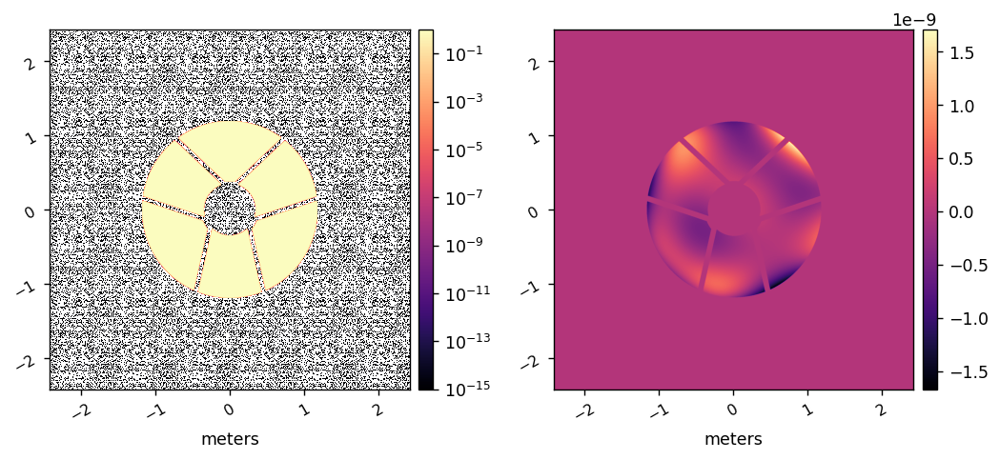

C:\Users\Kian Milani\Desktop\roman-waves\phasec\spc-wide\wf_polmap_proper.fits


In [38]:
wavefront = proper.prop_begin( diam, lambda_m, n, float(pupil_diam_pix)/n )
pupil = proper.prop_fits_read( pupil_file )
proper.prop_multiply( wavefront, trim(pupil,n) )
if polaxis != 0: polmap( wavefront, polfile, pupil_diam_pix, polaxis )

wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
wf_phase = proper.prop_get_phase(wavefront)
wf_sampling = proper.prop_get_sampling(wavefront)

misc.myimshow2(wf_int, wf_phase, pxscl=wf_sampling*u.m/u.pix, lognorm1=True, vmin1=1e-15)
if save_waves:
    wf = np.zeros(shape=(2,n,n))
    wf[0,:,:] = wf_int
    wf[1,:,:] = wf_phase

    wf_fname = 'wf_polmap'
    wf_fpath = wf_dir + wf_fname + '_proper' + '.fits'
    print(wf_fpath)
    hdr = fits.Header()
    hdr['PIXELSCL'] = wf_sampling

    wf_hdu = fits.PrimaryHDU(wf, header=hdr)
    wf_hdu.writeto(wf_fpath, overwrite=True)

# Begin the propagation and initialize the wavefront object.

Applying lens
C:\Users\Kian Milani\Desktop\roman-cgi-phasec-data\spc-wide-opds\roman_phasec_PRIMARY_synthetic_phase_error_V1.0.fits 0.002363114


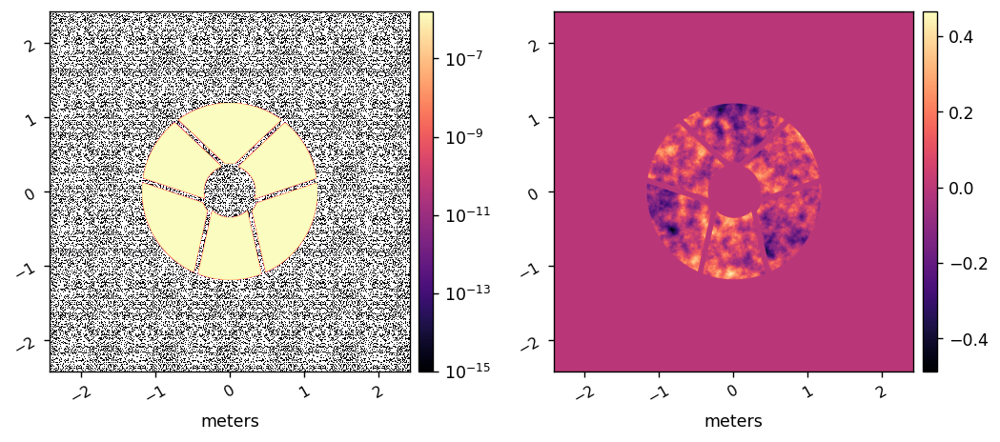

0.002363114
C:\Users\Kian Milani\Desktop\roman-waves\phasec\spc-wide\wf_primary_proper.fits


In [7]:
wavefront = proper.prop_begin( diam, lambda_m, n, float(pupil_diam_pix)/n )
if cor_type == 'none':
    proper.prop_circular_aperture( wavefront, 1.0, NORM=True )
else:
    if np.isscalar(pupil_array):
        pupil = proper.prop_fits_read( pupil_file )
        proper.prop_multiply( wavefront, trim(pupil,n) )
        pupil = 0
    else:
        proper.prop_multiply( wavefront, trim(pupil_array,n) )
if polaxis != 0: polmap( wavefront, polfile, pupil_diam_pix, polaxis )
proper.prop_define_entrance( wavefront )
proper.prop_lens( wavefront, fl_pri )
if source_x_offset != 0 or source_y_offset != 0:
    # compute tilted wavefront to offset source by xoffset,yoffset lambda0_m/D
    xtilt_lam = -source_x_offset * lambda0_m / lambda_m
    ytilt_lam = -source_y_offset * lambda0_m / lambda_m
    x = np.tile( (np.arange(n)-n//2)/(pupil_diam_pix/2.0), (n,1) )
    y = np.transpose(x)
    proper.prop_multiply( wavefront, np.exp(complex(0,1) * np.pi * (xtilt_lam * x + ytilt_lam * y)) )
    x = 0
    y = 0
if zindex[0] != 0: proper.prop_zernikes( wavefront, zindex, zval_m )
if use_errors != 0: 
    map_fname = 'roman_phasec_PRIMARY_synthetic_phase_error_V1.0.fits'
    dmap = proper.prop_errormap( wavefront, map_dir+map_fname, WAVEFRONT=True )
    sampling = proper.prop_get_sampling(wavefront)
    dmaphdr = fits.Header(); dmaphdr['PIXELSCL'] = sampling
    dmaphdu = fits.PrimaryHDU(data=dmap, header=dmaphdr)
    dmaphdu.writeto(map_dir_new+map_fname, overwrite=True)
    print(map_dir_new+map_fname, sampling)
    
wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
wf_phase = proper.prop_get_phase(wavefront)
wf_sampling = proper.prop_get_sampling(wavefront)

misc.myimshow2(wf_int, wf_phase, pxscl=wf_sampling*u.m/u.pix, lognorm1=True, vmin1=1e-15)
print(wf_sampling)
if save_waves:
    wf = np.zeros(shape=(2,n,n))
    wf[0,:,:] = wf_int
    wf[1,:,:] = wf_phase

    wf_fname = 'wf_primary'
    wf_fpath = wf_dir + wf_fname + '_proper' + '.fits'
    print(wf_fpath)
    hdr = fits.Header()
    hdr['PIXELSCL'] = wf_sampling

    wf_hdu = fits.PrimaryHDU(wf, header=hdr)
    wf_hdu.writeto(wf_fpath, overwrite=True)

# Propagate to the secondary mirror.

Propagating to secondary
Applying lens
C:\Users\Kian Milani\Desktop\roman-cgi-phasec-data\spc-wide-opds\roman_phasec_SECONDARY_synthetic_phase_error_V1.0.fits 0.0004605276918289606


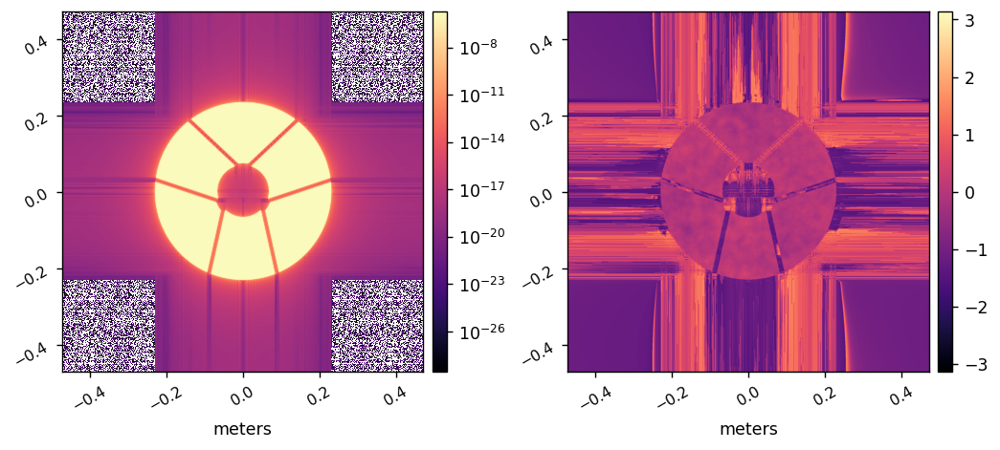

C:\Users\Kian Milani\Desktop\roman-waves\phasec\spc-wide\wf_secondary_proper.fits


In [8]:
proper.prop_propagate( wavefront, d_pri_sec, 'secondary' )
proper.prop_lens( wavefront, fl_sec )
if use_errors != 0: 
    map_fname = 'roman_phasec_SECONDARY_synthetic_phase_error_V1.0.fits'
    dmap = proper.prop_errormap( wavefront, map_dir+map_fname, WAVEFRONT=True )
    sampling = proper.prop_get_sampling(wavefront)
    dmaphdr = fits.Header(); dmaphdr['PIXELSCL'] = sampling
    dmaphdu = fits.PrimaryHDU(data=dmap, header=dmaphdr)
    dmaphdu.writeto(map_dir_new+map_fname, overwrite=True)
    print(map_dir_new+map_fname, sampling)
if use_aperture != 0: proper.prop_circular_aperture( wavefront, diam_sec/2.0 )  
    
wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
wf_phase = proper.prop_get_phase(wavefront)
wf_sampling = proper.prop_get_sampling(wavefront)

misc.myimshow2(wf_int, wf_phase, pxscl=wf_sampling*u.m/u.pix, lognorm1=True)
if save_waves:
    wf = np.zeros(shape=(2,n,n))
    wf[0,:,:] = wf_int
    wf[1,:,:] = wf_phase

    wf_fname = 'wf_secondary'
    wf_fpath = wf_dir + wf_fname + '_proper' + '.fits'
    print(wf_fpath)
    hdr = fits.Header()
    hdr['PIXELSCL'] = wf_sampling

    wf_hdu = fits.PrimaryHDU(wf, header=hdr)
    wf_hdu.writeto(wf_fpath, overwrite=True)

# Propagate to the first fold mirror.

Propagating to POMA FOLD
C:\Users\Kian Milani\Desktop\roman-cgi-phasec-data\spc-wide-opds\roman_phasec_POMAFOLD_measured_phase_error_V1.1.fits 7.54345336157586e-05


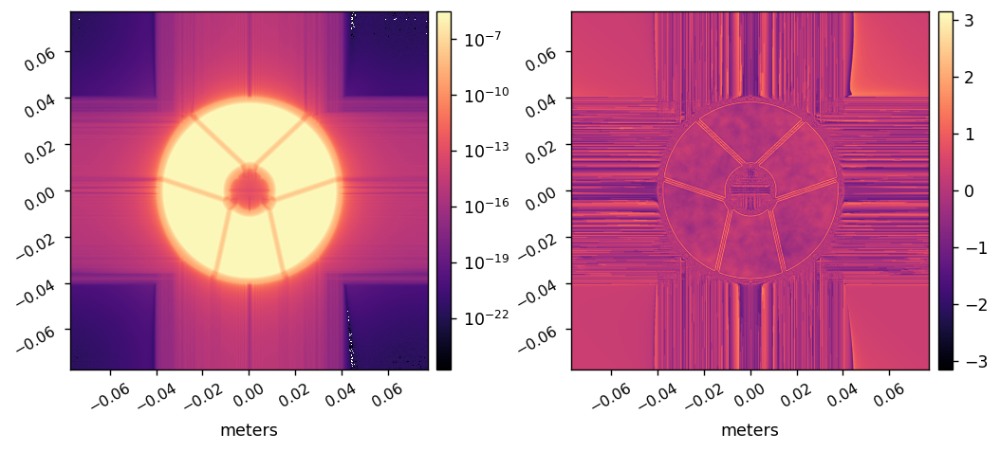

C:\Users\Kian Milani\Desktop\roman-waves\phasec\spc-wide\wf_pomafold_proper.fits


In [9]:
proper.prop_propagate( wavefront, d_sec_pomafold, 'POMA FOLD' )
if use_errors != 0: 
    map_fname = 'roman_phasec_POMAFOLD_measured_phase_error_V1.1.fits'
    dmap = proper.prop_errormap( wavefront, map_dir+map_fname, WAVEFRONT=True )
    sampling = proper.prop_get_sampling(wavefront)
    dmaphdr = fits.Header(); dmaphdr['PIXELSCL'] = sampling
    dmaphdu = fits.PrimaryHDU(data=dmap, header=dmaphdr)
    dmaphdu.writeto(map_dir_new+map_fname, overwrite=True)
    print(map_dir_new+map_fname, sampling)
if use_aperture != 0: proper.prop_circular_aperture( wavefront, diam_pomafold/2.0 ) 
    
wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
wf_phase = proper.prop_get_phase(wavefront)
wf_sampling = proper.prop_get_sampling(wavefront)

misc.myimshow2(wf_int, wf_phase, pxscl=wf_sampling*u.m/u.pix, lognorm1=True)
if save_waves:
    wf = np.zeros(shape=(2,n,n))
    wf[0,:,:] = wf_int
    wf[1,:,:] = wf_phase

    wf_fname = 'wf_pomafold'
    wf_fpath = wf_dir + wf_fname + '_proper' + '.fits'
    print(wf_fpath)
    hdr = fits.Header()
    hdr['PIXELSCL'] = wf_sampling

    wf_hdu = fits.PrimaryHDU(wf, header=hdr)
    wf_hdu.writeto(wf_fpath, overwrite=True)

# Propagate to M3.

Propagating to M3
Applying lens
C:\Users\Kian Milani\Desktop\roman-cgi-phasec-data\spc-wide-opds\roman_phasec_M3_measured_phase_error_V1.1.fits 0.0001407879772329341


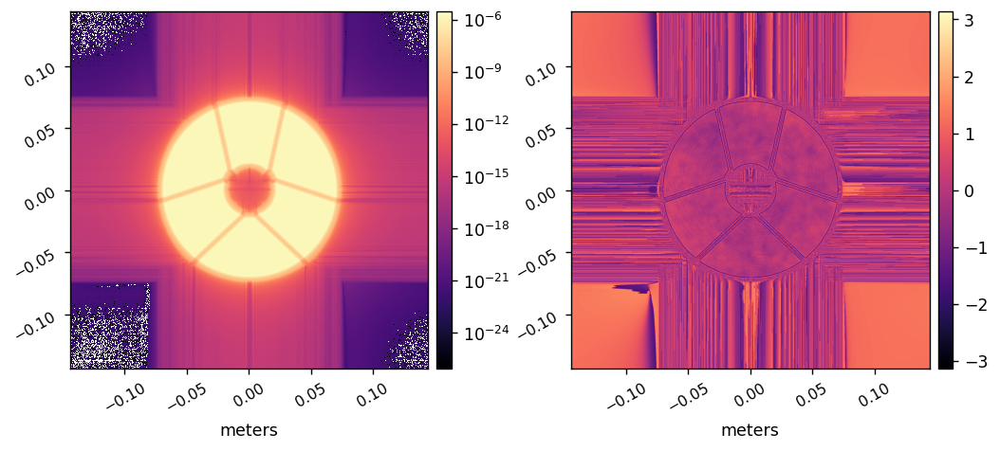

C:\Users\Kian Milani\Desktop\roman-waves\phasec\spc-wide\wf_m3_proper.fits


In [10]:
proper.prop_propagate( wavefront, d_pomafold_m3, 'M3' )
proper.prop_lens( wavefront, fl_m3 )
if use_errors != 0: 
    map_fname = 'roman_phasec_M3_measured_phase_error_V1.1.fits'
    dmap = proper.prop_errormap( wavefront, map_dir+map_fname, WAVEFRONT=True )
    sampling = proper.prop_get_sampling(wavefront)
    dmaphdr = fits.Header(); dmaphdr['PIXELSCL'] = sampling
    dmaphdu = fits.PrimaryHDU(data=dmap, header=dmaphdr)
    dmaphdu.writeto(map_dir_new+map_fname, overwrite=True)
    print(map_dir_new+map_fname, sampling)
if use_aperture != 0: proper.prop_circular_aperture( wavefront, diam_m3/2.0 ) 

wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
wf_phase = proper.prop_get_phase(wavefront)
wf_sampling = proper.prop_get_sampling(wavefront)

misc.myimshow2(wf_int, wf_phase, pxscl=wf_sampling*u.m/u.pix, lognorm1=True)
if save_waves:
    wf = np.zeros(shape=(2,n,n))
    wf[0,:,:] = wf_int
    wf[1,:,:] = wf_phase

    wf_fname = 'wf_m3'
    wf_fpath = wf_dir + wf_fname + '_proper' + '.fits'
    print(wf_fpath)
    hdr = fits.Header()
    hdr['PIXELSCL'] = wf_sampling

    wf_hdu = fits.PrimaryHDU(wf, header=hdr)
    wf_hdu.writeto(wf_fpath, overwrite=True)

# Propagate to M4.

Propagating to M4
Applying lens
C:\Users\Kian Milani\Desktop\roman-cgi-phasec-data\spc-wide-opds\roman_phasec_M4_measured_phase_error_V1.1.fits 4.66100371133689e-05


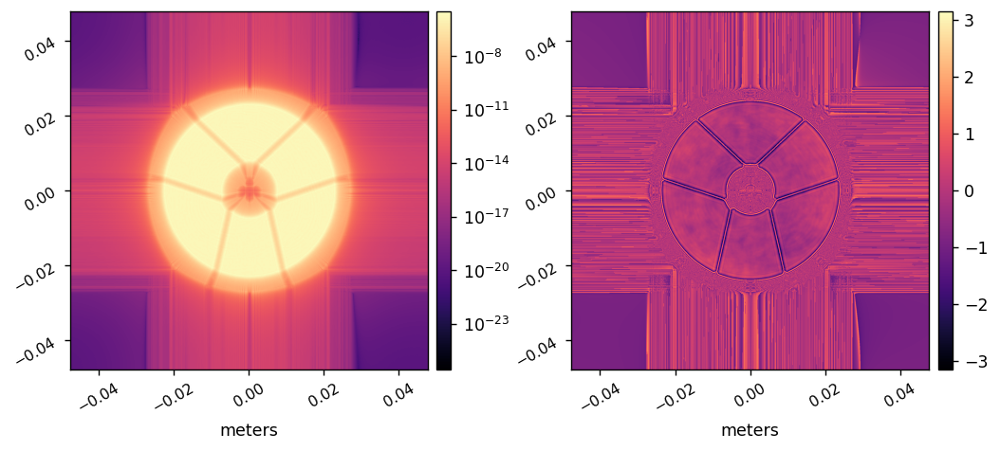

C:\Users\Kian Milani\Desktop\roman-waves\phasec\spc-wide\wf_m4_proper.fits


In [11]:
proper.prop_propagate( wavefront, d_m3_m4, 'M4' )
proper.prop_lens( wavefront, fl_m4 )
if use_errors != 0: 
    map_fname = 'roman_phasec_M4_measured_phase_error_V1.1.fits'
    dmap = proper.prop_errormap( wavefront, map_dir+map_fname, WAVEFRONT=True )
    sampling = proper.prop_get_sampling(wavefront)
    dmaphdr = fits.Header(); dmaphdr['PIXELSCL'] = sampling
    dmaphdu = fits.PrimaryHDU(data=dmap, header=dmaphdr)
    dmaphdu.writeto(map_dir_new+map_fname, overwrite=True)
    print(map_dir_new+map_fname, sampling)
if use_aperture != 0: proper.prop_circular_aperture( wavefront, diam_m4/2.0 ) 
    
wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
wf_phase = proper.prop_get_phase(wavefront)
wf_sampling = proper.prop_get_sampling(wavefront)

misc.myimshow2(wf_int, wf_phase, pxscl=wf_sampling*u.m/u.pix, lognorm1=True)
if save_waves:
    wf = np.zeros(shape=(2,n,n))
    wf[0,:,:] = wf_int
    wf[1,:,:] = wf_phase

    wf_fname = 'wf_m4'
    wf_fpath = wf_dir + wf_fname + '_proper' + '.fits'
    print(wf_fpath)
    hdr = fits.Header()
    hdr['PIXELSCL'] = wf_sampling

    wf_hdu = fits.PrimaryHDU(wf, header=hdr)
    wf_hdu.writeto(wf_fpath, overwrite=True)

# Propagate to M5.

Propagating to M5
Applying lens
C:\Users\Kian Milani\Desktop\roman-cgi-phasec-data\spc-wide-opds\roman_phasec_M5_measured_phase_error_V1.1.fits 4.0234948878715836e-05


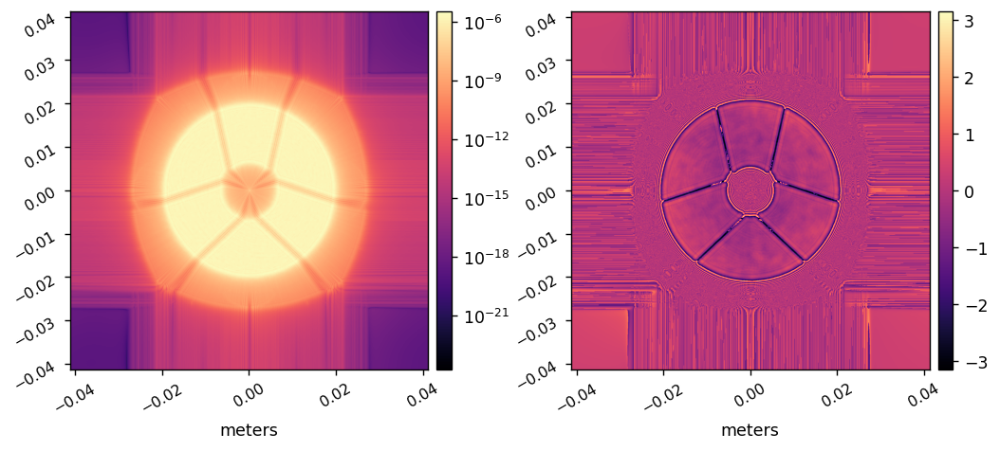

C:\Users\Kian Milani\Desktop\roman-waves\phasec\spc-wide\wf_m5_proper.fits


In [12]:
proper.prop_propagate( wavefront, d_m4_m5, 'M5' )
proper.prop_lens( wavefront, fl_m5 )
if use_errors != 0: 
    map_fname = 'roman_phasec_M5_measured_phase_error_V1.1.fits'
    dmap = proper.prop_errormap( wavefront, map_dir+map_fname, WAVEFRONT=True )
    sampling = proper.prop_get_sampling(wavefront)
    dmaphdr = fits.Header(); dmaphdr['PIXELSCL'] = sampling
    dmaphdu = fits.PrimaryHDU(data=dmap, header=dmaphdr)
    dmaphdu.writeto(map_dir_new+map_fname, overwrite=True)
    print(map_dir_new+map_fname, sampling)
if use_aperture != 0: proper.prop_circular_aperture( wavefront, diam_m5/2.0 ) 
    
wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
wf_phase = proper.prop_get_phase(wavefront)
wf_sampling = proper.prop_get_sampling(wavefront)

misc.myimshow2(wf_int, wf_phase, pxscl=wf_sampling*u.m/u.pix, lognorm1=True)
if save_waves:
    wf = np.zeros(shape=(2,n,n))
    wf[0,:,:] = wf_int
    wf[1,:,:] = wf_phase

    wf_fname = 'wf_m5'
    wf_fpath = wf_dir + wf_fname + '_proper' + '.fits'
    print(wf_fpath)
    hdr = fits.Header()
    hdr['PIXELSCL'] = wf_sampling

    wf_hdu = fits.PrimaryHDU(wf, header=hdr)
    wf_hdu.writeto(wf_fpath, overwrite=True)

# Propagate to the second fold mirror.

Propagating to TT FOLD
C:\Users\Kian Milani\Desktop\roman-cgi-phasec-data\spc-wide-opds\roman_phasec_TTFOLD_measured_phase_error_V1.1.fits 4.0234948878715836e-05


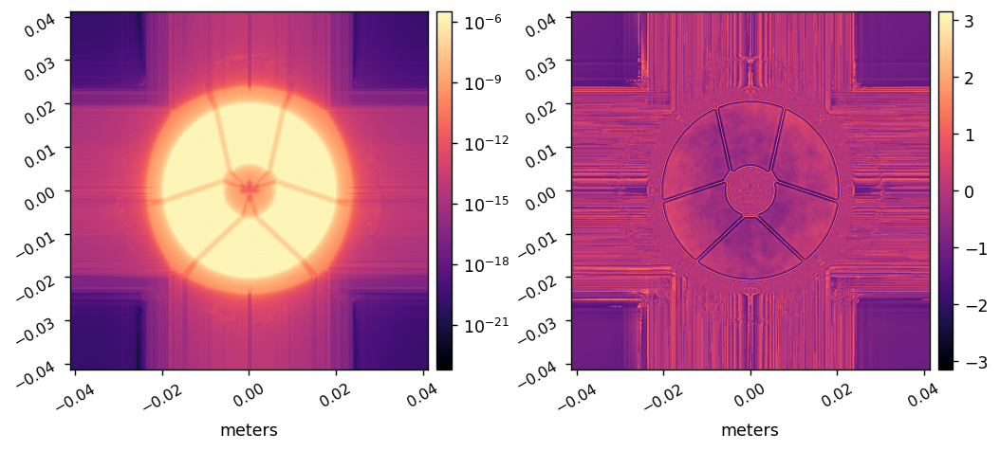

C:\Users\Kian Milani\Desktop\roman-waves\phasec\spc-wide\wf_ttfold_proper.fits


In [13]:
proper.prop_propagate( wavefront, d_m5_ttfold, 'TT FOLD' )
if use_errors != 0:
    map_fname = 'roman_phasec_TTFOLD_measured_phase_error_V1.1.fits'
    dmap = proper.prop_errormap( wavefront, map_dir+map_fname, WAVEFRONT=True )
    sampling = proper.prop_get_sampling(wavefront)
    dmaphdr = fits.Header(); dmaphdr['PIXELSCL'] = sampling
    dmaphdu = fits.PrimaryHDU(data=dmap, header=dmaphdr)
    dmaphdu.writeto(map_dir_new+map_fname, overwrite=True)
    print(map_dir_new+map_fname, sampling)
if use_aperture != 0: proper.prop_circular_aperture( wavefront, diam_ttfold/2.0 )
    
wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
wf_phase = proper.prop_get_phase(wavefront)
wf_sampling = proper.prop_get_sampling(wavefront)

misc.myimshow2(wf_int, wf_phase, pxscl=wf_sampling*u.m/u.pix, lognorm1=True)
if save_waves:
    wf = np.zeros(shape=(2,n,n))
    wf[0,:,:] = wf_int
    wf[1,:,:] = wf_phase

    wf_fname = 'wf_ttfold'
    wf_fpath = wf_dir + wf_fname + '_proper' + '.fits'
    print(wf_fpath)
    hdr = fits.Header()
    hdr['PIXELSCL'] = wf_sampling

    wf_hdu = fits.PrimaryHDU(wf, header=hdr)
    wf_hdu.writeto(wf_fpath, overwrite=True)

# Propagate to FSM.

Propagating to FSM
C:\Users\Kian Milani\Desktop\roman-cgi-phasec-data\spc-wide-opds\roman_phasec_LOWORDER_phase_error_V2.0.fits 4.0234948878715836e-05
C:\Users\Kian Milani\Desktop\roman-cgi-phasec-data\spc-wide-opds\roman_phasec_FSM_FLIGHT_measured_coated_phase_error_V2.0.fits 4.0234948878715836e-05


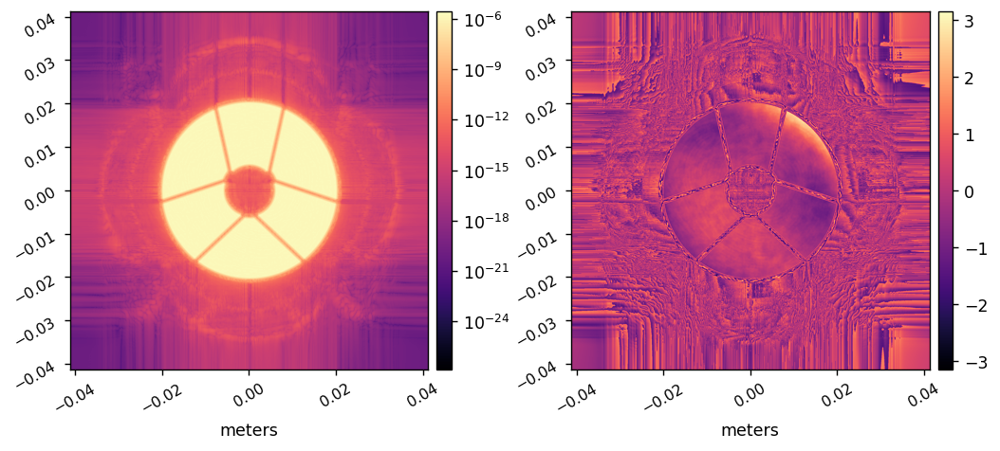

C:\Users\Kian Milani\Desktop\roman-waves\phasec\spc-wide\wf_fsm_proper.fits


In [14]:
proper.prop_propagate( wavefront, d_ttfold_fsm, 'FSM' )
if use_errors != 0: 
    map_fname = 'roman_phasec_LOWORDER_phase_error_V2.0.fits'
    dmap = proper.prop_errormap( wavefront, map_dir+map_fname, WAVEFRONT=True )
    sampling = proper.prop_get_sampling(wavefront)
    dmaphdr = fits.Header(); dmaphdr['PIXELSCL'] = sampling
    dmaphdu = fits.PrimaryHDU(data=dmap, header=dmaphdr)
    dmaphdu.writeto(map_dir_new+map_fname, overwrite=True)
    print(map_dir_new+map_fname, sampling)
if cgi_x_shift_pupdiam != 0 or cgi_y_shift_pupdiam != 0 or cgi_x_shift_m != 0 or cgi_y_shift_m != 0:    # bulk coronagraph pupil shear
    # FFT the field, apply a tilt, FFT back
    if cgi_x_shift_pupdiam != 0 or cgi_y_shift_pupdiam != 0:
        # offsets are normalized to pupil diameter
        xt = -cgi_x_shift_pupdiam * pupil_diam_pix * float(pupil_diam_pix)/n 
        yt = -cgi_y_shift_pupdiam * pupil_diam_pix * float(pupil_diam_pix)/n
    else:
        # offsets are meters
        d_m = proper.prop_get_sampling(wavefront) 
        xt = -cgi_x_shift_m / d_m * float(pupil_diam_pix)/n 
        yt = -cgi_y_shift_m / d_m * float(pupil_diam_pix)/n 
    x = np.tile( (np.arange(n)-n//2) / (pupil_diam_pix/2.0), (n,1) )
    y = np.transpose(x)
    tilt = complex(0,1) * np.pi * (x*xt + y*yt)
    x = 0
    y = 0
    wavefront0 = proper.prop_get_wavefront(wavefront)
    wavefront0 = ffts( wavefront0, -1 )
    wavefront0 *= np.exp(tilt)
    wavefront0 = ffts( wavefront0, 1 )
    tilt = 0
    wavefront.wfarr[:,:] = proper.prop_shift_center(wavefront0)
    wavefront0 = 0
if use_errors != 0: 
    map_fname = 'roman_phasec_FSM_FLIGHT_measured_coated_phase_error_V2.0.fits'
    dmap = proper.prop_errormap( wavefront, map_dir+map_fname, WAVEFRONT=True )
    sampling = proper.prop_get_sampling(wavefront)
    dmaphdr = fits.Header(); dmaphdr['PIXELSCL'] = sampling
    dmaphdu = fits.PrimaryHDU(data=dmap, header=dmaphdr)
    dmaphdu.writeto(map_dir_new+map_fname, overwrite=True)
    print(map_dir_new+map_fname, sampling)
if use_aperture != 0: proper.prop_circular_aperture( wavefront, diam_fsm/2.0 )
if ( fsm_x_offset != 0.0 or fsm_y_offset != 0.0 ):
    # compute tilted wavefront to offset source by fsm_x_offset,fsm_y_offset lambda0_m/D
    xtilt_lam = fsm_x_offset * lambda0_m / lambda_m
    ytilt_lam = fsm_y_offset * lambda0_m / lambda_m
    x = np.tile( (np.arange(n)-n//2) / (pupil_diam_pix/2.0), (n,1) )
    y = np.transpose(x)
    proper.prop_multiply( wavefront, np.exp(complex(0,1) * np.pi * (xtilt_lam * x + ytilt_lam * y)) )
    x = 0
    y = 0
    
wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
wf_phase = proper.prop_get_phase(wavefront)
wf_sampling = proper.prop_get_sampling(wavefront)

misc.myimshow2(wf_int, wf_phase, pxscl=wf_sampling*u.m/u.pix, lognorm1=True)
if save_waves:
    wf = np.zeros(shape=(2,n,n))
    wf[0,:,:] = wf_int
    wf[1,:,:] = wf_phase

    wf_fname = 'wf_fsm'
    wf_fpath = wf_dir + wf_fname + '_proper' + '.fits'
    print(wf_fpath)
    hdr = fits.Header()
    hdr['PIXELSCL'] = wf_sampling

    wf_hdu = fits.PrimaryHDU(wf, header=hdr)
    wf_hdu.writeto(wf_fpath, overwrite=True)

# Propagate to OAP1.

Propagating to OAP1
Applying lens
C:\Users\Kian Milani\Desktop\roman-cgi-phasec-data\spc-wide-opds\roman_phasec_OAP1_phase_error_V3.0.fits 4.0234948878715836e-05


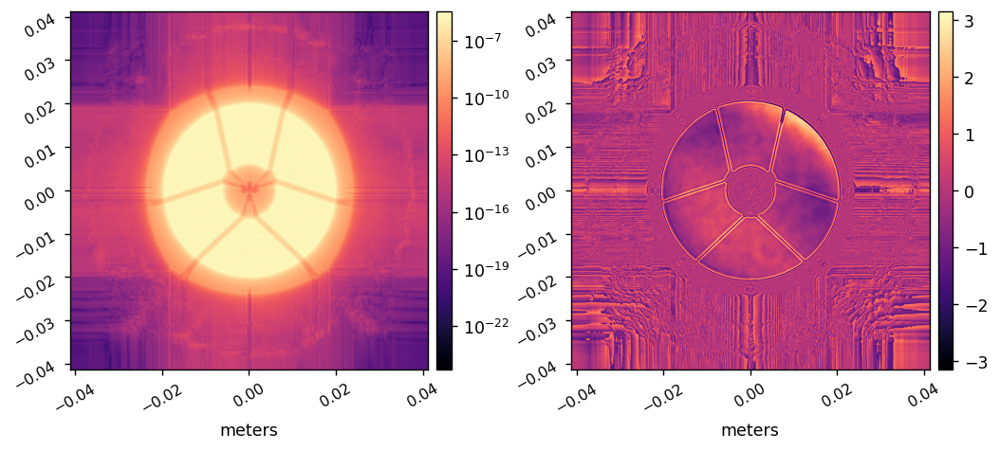

C:\Users\Kian Milani\Desktop\roman-waves\phasec\spc-wide\wf_oap1_proper.fits


In [15]:
proper.prop_propagate( wavefront, d_fsm_oap1, 'OAP1' )
proper.prop_lens( wavefront, fl_oap1 )
if use_errors != 0: 
    map_fname = 'roman_phasec_OAP1_phase_error_V3.0.fits'
    dmap = proper.prop_errormap( wavefront, map_dir+map_fname, WAVEFRONT=True )
    sampling = proper.prop_get_sampling(wavefront)
    dmaphdr = fits.Header(); dmaphdr['PIXELSCL'] = sampling
    dmaphdu = fits.PrimaryHDU(data=dmap, header=dmaphdr)
    dmaphdu.writeto(map_dir_new+map_fname, overwrite=True)
    print(map_dir_new+map_fname, sampling)
if use_aperture != 0: proper.prop_circular_aperture( wavefront, diam_oap1/2.0 )  
    
wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
wf_phase = proper.prop_get_phase(wavefront)
wf_sampling = proper.prop_get_sampling(wavefront)

misc.myimshow2(wf_int, wf_phase, pxscl=wf_sampling*u.m/u.pix, lognorm1=True)
if save_waves:
    wf = np.zeros(shape=(2,n,n))
    wf[0,:,:] = wf_int
    wf[1,:,:] = wf_phase

    wf_fname = 'wf_oap1'
    wf_fpath = wf_dir + wf_fname + '_proper' + '.fits'
    print(wf_fpath)
    hdr = fits.Header()
    hdr['PIXELSCL'] = wf_sampling

    wf_hdu = fits.PrimaryHDU(wf, header=hdr)
    wf_hdu.writeto(wf_fpath, overwrite=True)

# Propagate to FOCM.

Propagating to FOCM
C:\Users\Kian Milani\Desktop\roman-cgi-phasec-data\spc-wide-opds\roman_phasec_FCM_EDU_measured_coated_phase_error_V2.0.fits 2.1159224740330934e-05


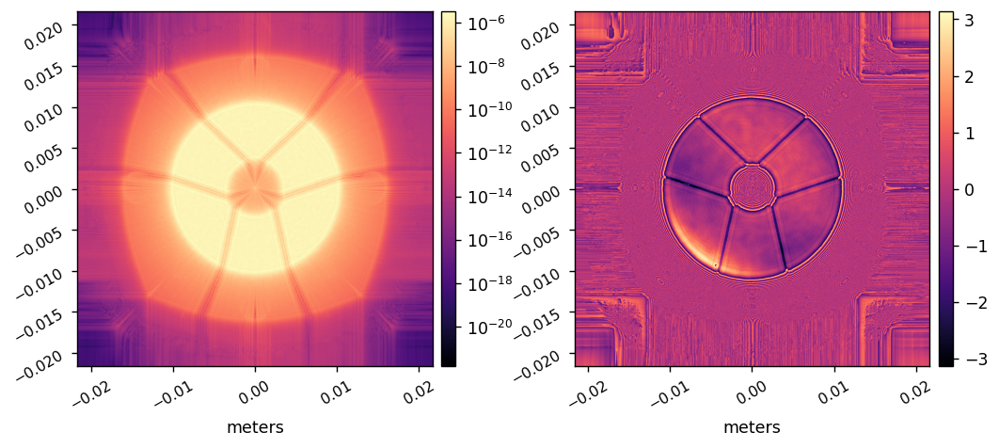

C:\Users\Kian Milani\Desktop\roman-waves\phasec\spc-wide\wf_focm_proper.fits


In [16]:
proper.prop_propagate( wavefront, d_oap1_focm, 'FOCM' )
if use_errors != 0: 
    map_fname = 'roman_phasec_FCM_EDU_measured_coated_phase_error_V2.0.fits'
    dmap = proper.prop_errormap( wavefront, map_dir+map_fname, WAVEFRONT=True )
    sampling = proper.prop_get_sampling(wavefront)
    dmaphdr = fits.Header(); dmaphdr['PIXELSCL'] = sampling
    dmaphdu = fits.PrimaryHDU(data=dmap, header=dmaphdr)
    dmaphdu.writeto(map_dir_new+map_fname, overwrite=True)
    print(map_dir_new+map_fname, sampling)
if use_aperture != 0: proper.prop_circular_aperture( wavefront, diam_focm/2.0 )
    
wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
wf_phase = proper.prop_get_phase(wavefront)
wf_sampling = proper.prop_get_sampling(wavefront)

misc.myimshow2(wf_int, wf_phase, pxscl=wf_sampling*u.m/u.pix, lognorm1=True)
if save_waves:
    wf = np.zeros(shape=(2,n,n))
    wf[0,:,:] = wf_int
    wf[1,:,:] = wf_phase

    wf_fname = 'wf_focm'
    wf_fpath = wf_dir + wf_fname + '_proper' + '.fits'
    print(wf_fpath)
    hdr = fits.Header()
    hdr['PIXELSCL'] = wf_sampling

    wf_hdu = fits.PrimaryHDU(wf, header=hdr)
    wf_hdu.writeto(wf_fpath, overwrite=True)

# Propagate to OAP2.

Propagating to OAP2
Applying lens
C:\Users\Kian Milani\Desktop\roman-cgi-phasec-data\spc-wide-opds\roman_phasec_OAP2_phase_error_V3.0.fits 4.630008115069422e-05


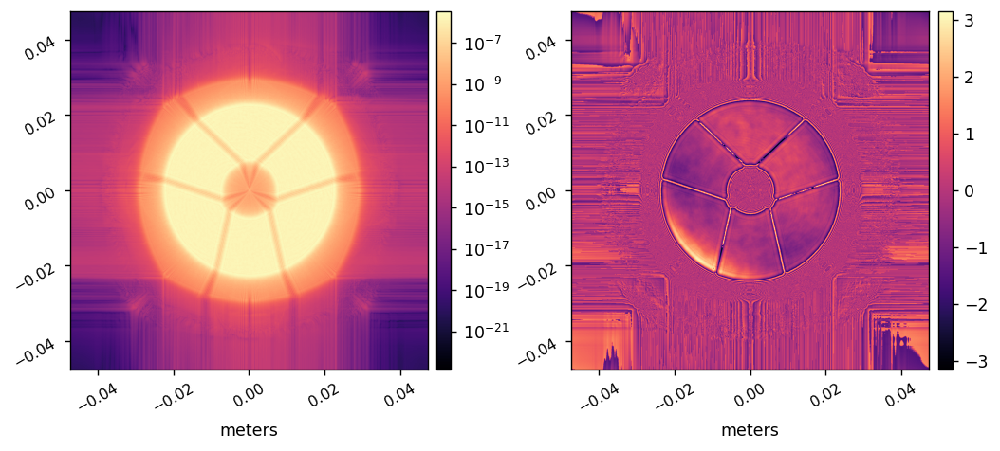

C:\Users\Kian Milani\Desktop\roman-waves\phasec\spc-wide\wf_oap2_proper.fits


In [17]:
proper.prop_propagate( wavefront, d_focm_oap2, 'OAP2' )
proper.prop_lens( wavefront, fl_oap2 )
if use_errors != 0:
    map_fname = 'roman_phasec_OAP2_phase_error_V3.0.fits'
    dmap = proper.prop_errormap( wavefront, map_dir+map_fname, WAVEFRONT=True )
    sampling = proper.prop_get_sampling(wavefront)
    dmaphdr = fits.Header(); dmaphdr['PIXELSCL'] = sampling
    dmaphdu = fits.PrimaryHDU(data=dmap, header=dmaphdr)
    dmaphdu.writeto(map_dir_new+map_fname, overwrite=True)
    print(map_dir_new+map_fname, sampling)
if use_aperture != 0: proper.prop_circular_aperture( wavefront, diam_oap2/2.0 ) 
    
wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
wf_phase = proper.prop_get_phase(wavefront)
wf_sampling = proper.prop_get_sampling(wavefront)

misc.myimshow2(wf_int, wf_phase, pxscl=wf_sampling*u.m/u.pix, lognorm1=True)
if save_waves:
    wf = np.zeros(shape=(2,n,n))
    wf[0,:,:] = wf_int
    wf[1,:,:] = wf_phase

    wf_fname = 'wf_oap2'
    wf_fpath = wf_dir + wf_fname + '_proper' + '.fits'
    print(wf_fpath)
    hdr = fits.Header()
    hdr['PIXELSCL'] = wf_sampling

    wf_hdu = fits.PrimaryHDU(wf, header=hdr)
    wf_hdu.writeto(wf_fpath, overwrite=True)

# Propagate to DM1.

Propagating to DM1
C:\Users\Kian Milani\Desktop\roman-cgi-phasec-data\spc-wide-opds\roman_phasec_DM1_phase_error_V1.0.fits 4.630008115069422e-05
4.630008115069422e-05


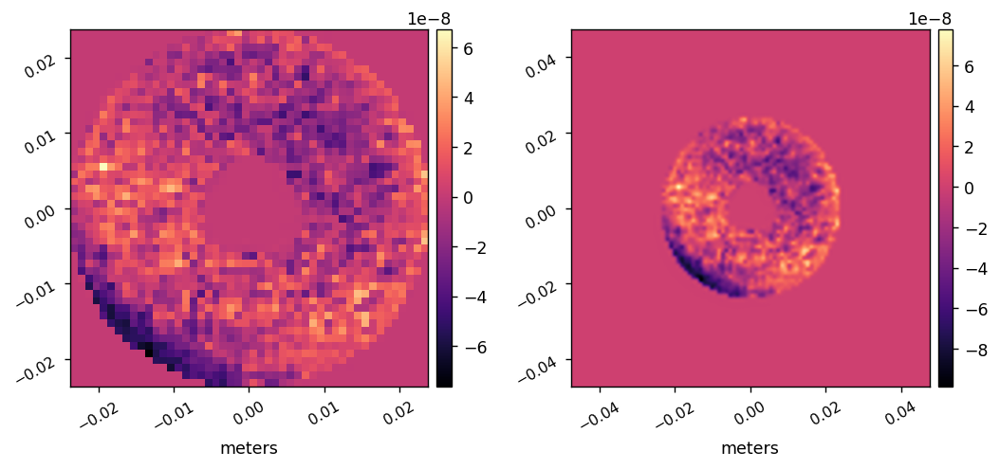

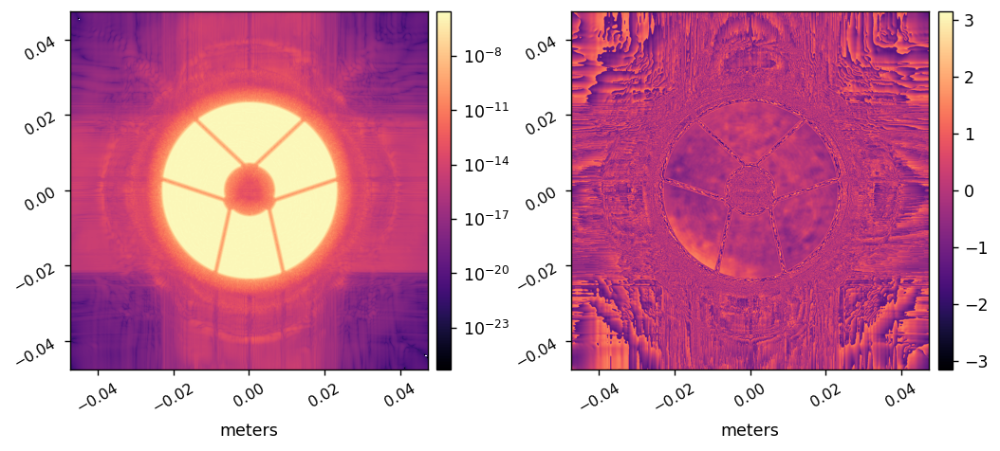

C:\Users\Kian Milani\Desktop\roman-waves\phasec\spc-wide\wf_dm1_proper.fits


In [18]:
proper.prop_propagate( wavefront, d_oap2_dm1, 'DM1' )
if use_errors != 0: 
    map_fname = 'roman_phasec_DM1_phase_error_V1.0.fits'
    dmap = proper.prop_errormap( wavefront, map_dir+map_fname, WAVEFRONT=True )
    sampling = proper.prop_get_sampling(wavefront)
    dmaphdr = fits.Header(); dmaphdr['PIXELSCL'] = sampling
    dmaphdu = fits.PrimaryHDU(data=dmap, header=dmaphdr)
    dmaphdu.writeto(map_dir_new+map_fname, overwrite=True)
    print(map_dir_new+map_fname, sampling)
if is_hlc == True and use_hlc_dm_patterns == 1 and hlc_dm1_file != '':
    hlc_dm1 = proper.prop_fits_read( hlc_dm1_file )
    dm1 = dm1_m + hlc_dm1
    use_dm1 = 1
    hlc_dm2 = proper.prop_fits_read( hlc_dm2_file )
    dm2 = dm2_m + hlc_dm2
    use_dm2 = 1
else:
    dm1 = dm1_m
    dm2 = dm2_m
if use_dm1 != 0: 
    dmap1 = proper.prop_dm(wavefront, dm1, dm1_xc_act, dm1_yc_act, dm_sampling_m, 
                           XTILT=dm1_xtilt_deg, YTILT=dm1_ytilt_deg, ZTILT=dm1_ztilt_deg )
    dm1_sampling = proper.prop_get_sampling(wavefront); print(dm1_sampling)
    hdr = fits.Header()
    hdr['PIXELSCL'] = dm1_sampling
    dmap1hdu = fits.PrimaryHDU(data=2*dmap1, header=hdr)
    dmap1hdu.writeto(data_dir_new+dm1_fname, overwrite=True)

    misc.myimshow2(dm1_m, dmap1, pxscl1=dm_sampling_m*u.m/u.pix, pxscl2=dm1_sampling*u.m/u.pix)

    
wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
wf_phase = proper.prop_get_phase(wavefront)
wf_sampling = proper.prop_get_sampling(wavefront)

misc.myimshow2(wf_int, wf_phase, pxscl=wf_sampling*u.m/u.pix, lognorm1=True)
if save_waves:
    wf = np.zeros(shape=(2,n,n))
    wf[0,:,:] = wf_int
    wf[1,:,:] = wf_phase

    wf_fname = 'wf_dm1'
    wf_fpath = wf_dir + wf_fname + '_proper' + '.fits'
    print(wf_fpath)
    hdr = fits.Header()
    hdr['PIXELSCL'] = wf_sampling

    wf_hdu = fits.PrimaryHDU(wf, header=hdr)
    wf_hdu.writeto(wf_fpath, overwrite=True)

# Propagate to DM2.

Propagating to DM2
4.630008115069422e-05


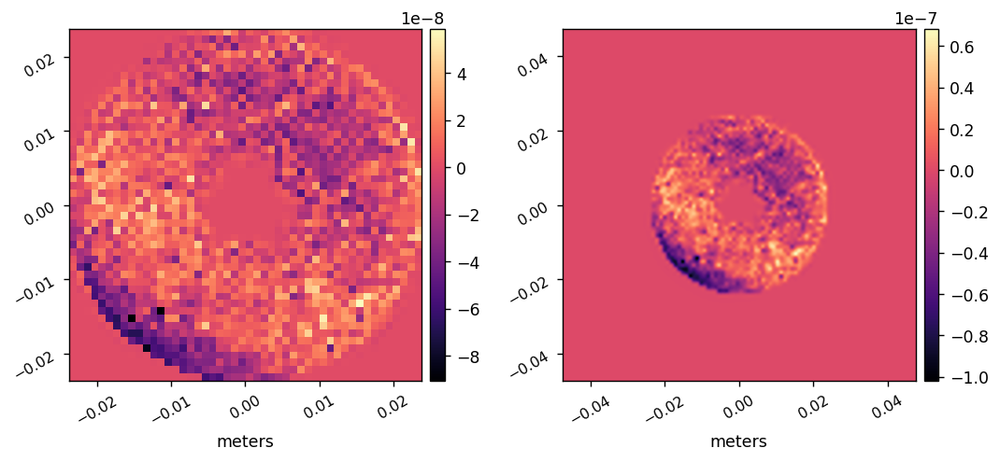

C:\Users\Kian Milani\Desktop\roman-cgi-phasec-data\spc-wide-opds\roman_phasec_DM2_phase_error_V1.0.fits 4.630008115069422e-05


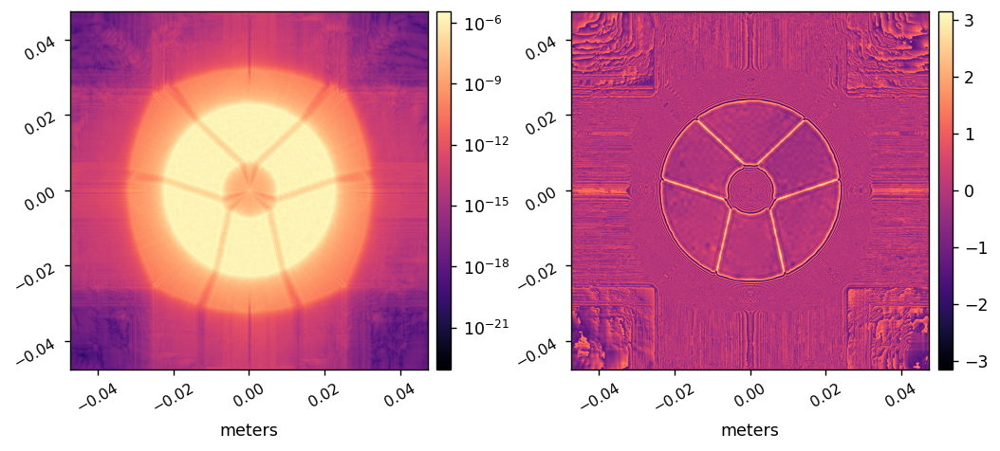

C:\Users\Kian Milani\Desktop\roman-waves\phasec\spc-wide\wf_dm2_proper.fits


In [19]:
proper.prop_propagate( wavefront, d_dm1_dm2, 'DM2' )
if use_dm2 == 1: 
    dmap2 = proper.prop_dm(wavefront, dm2, dm2_xc_act, dm2_yc_act, dm_sampling_m, 
                           XTILT=dm2_xtilt_deg, YTILT=dm2_ytilt_deg, ZTILT=dm2_ztilt_deg )
    dm2_sampling = proper.prop_get_sampling(wavefront); print(dm2_sampling)
    hdr = fits.Header()
    hdr['PIXELSCL'] = dm2_sampling
    dmap2hdu = fits.PrimaryHDU(data=2*dmap2, header=hdr)
    dmap2hdu.writeto(data_dir_new+dm2_fname, overwrite=True)

    misc.myimshow2(dm2_m, dmap2, pxscl1=dm_sampling_m*u.m/u.pix, pxscl2=dm2_sampling*u.m/u.pix)
if use_errors != 0:
    map_fname = 'roman_phasec_DM2_phase_error_V1.0.fits'
    dmap = proper.prop_errormap( wavefront, map_dir+map_fname, WAVEFRONT=True )
    sampling = proper.prop_get_sampling(wavefront)
    dmaphdr = fits.Header(); dmaphdr['PIXELSCL'] = sampling
    dmaphdu = fits.PrimaryHDU(data=dmap, header=dmaphdr)
    dmaphdu.writeto(map_dir_new+map_fname, overwrite=True)
    print(map_dir_new+map_fname, sampling)
if is_hlc == True:
    dm2mask = proper.prop_fits_read( file_directory+'dm2mask.fits' )
    proper.prop_multiply( wavefront, trim(dm2mask, n) )
    dm2mask = 0
    
wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
wf_phase = proper.prop_get_phase(wavefront)
wf_sampling = proper.prop_get_sampling(wavefront)

misc.myimshow2(wf_int, wf_phase, pxscl=wf_sampling*u.m/u.pix, lognorm1=True)
if save_waves:
    wf = np.zeros(shape=(2,n,n))
    wf[0,:,:] = wf_int
    wf[1,:,:] = wf_phase

    wf_fname = 'wf_dm2'
    wf_fpath = wf_dir + wf_fname + '_proper' + '.fits'
    print(wf_fpath)
    hdr = fits.Header()
    hdr['PIXELSCL'] = wf_sampling

    wf_hdu = fits.PrimaryHDU(wf, header=hdr)
    wf_hdu.writeto(wf_fpath, overwrite=True)

# Propagate to OAP3.

Propagating to OAP3
Applying lens
C:\Users\Kian Milani\Desktop\roman-cgi-phasec-data\spc-wide-opds\roman_phasec_OAP3_phase_error_V3.0.fits 4.630008115069422e-05


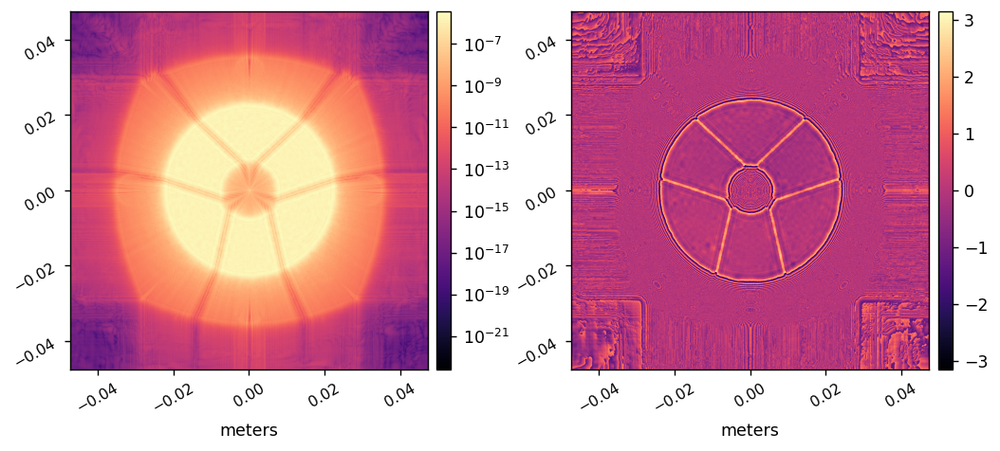

C:\Users\Kian Milani\Desktop\roman-waves\phasec\spc-wide\wf_oap3_proper.fits


In [20]:
proper.prop_propagate( wavefront, d_dm2_oap3, 'OAP3' )
proper.prop_lens( wavefront, fl_oap3 )
if use_errors != 0: 
    map_fname = 'roman_phasec_OAP3_phase_error_V3.0.fits'
    dmap = proper.prop_errormap( wavefront, map_dir+map_fname, WAVEFRONT=True )
    sampling = proper.prop_get_sampling(wavefront)
    dmaphdr = fits.Header(); dmaphdr['PIXELSCL'] = sampling
    dmaphdu = fits.PrimaryHDU(data=dmap, header=dmaphdr)
    dmaphdu.writeto(map_dir_new+map_fname, overwrite=True)
    print(map_dir_new+map_fname, sampling)
if use_aperture != 0: proper.prop_circular_aperture( wavefront, diam_oap3/2.0 ) 
    
wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
wf_phase = proper.prop_get_phase(wavefront)
wf_sampling = proper.prop_get_sampling(wavefront)

misc.myimshow2(wf_int, wf_phase, pxscl=wf_sampling*u.m/u.pix, lognorm1=True)
if save_waves:
    wf = np.zeros(shape=(2,n,n))
    wf[0,:,:] = wf_int
    wf[1,:,:] = wf_phase

    wf_fname = 'wf_oap3'
    wf_fpath = wf_dir + wf_fname + '_proper' + '.fits'
    print(wf_fpath)
    hdr = fits.Header()
    hdr['PIXELSCL'] = wf_sampling

    wf_hdu = fits.PrimaryHDU(wf, header=hdr)
    wf_hdu.writeto(wf_fpath, overwrite=True)

# Propagate to the third fold mirror.

Propagating to FOLD_3
C:\Users\Kian Milani\Desktop\roman-cgi-phasec-data\spc-wide-opds\roman_phasec_FOLD3_FLIGHT_measured_coated_phase_error_V2.0.fits 2.707945455669516e-05


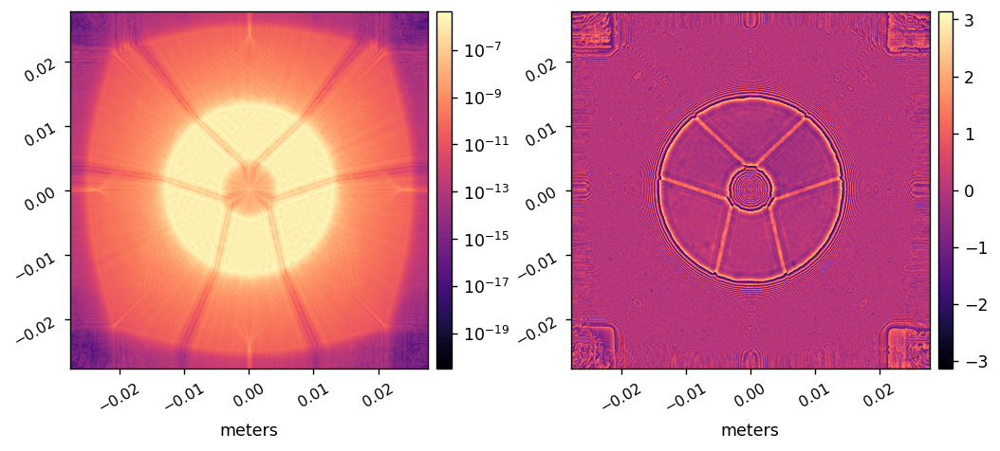

C:\Users\Kian Milani\Desktop\roman-waves\phasec\spc-wide\wf_fold3_proper.fits


In [21]:
proper.prop_propagate( wavefront, d_oap3_fold3, 'FOLD_3' )
if use_errors != 0: 
    map_fname = 'roman_phasec_FOLD3_FLIGHT_measured_coated_phase_error_V2.0.fits'
    dmap = proper.prop_errormap( wavefront, map_dir+map_fname, WAVEFRONT=True )
    sampling = proper.prop_get_sampling(wavefront)
    dmaphdr = fits.Header(); dmaphdr['PIXELSCL'] = sampling
    dmaphdu = fits.PrimaryHDU(data=dmap, header=dmaphdr)
    dmaphdu.writeto(map_dir_new+map_fname, overwrite=True)
    print(map_dir_new+map_fname, sampling)
if use_aperture != 0: proper.prop_circular_aperture( wavefront, diam_fold3/2.0 )
    
wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
wf_phase = proper.prop_get_phase(wavefront)
wf_sampling = proper.prop_get_sampling(wavefront)

misc.myimshow2(wf_int, wf_phase, pxscl=wf_sampling*u.m/u.pix, lognorm1=True)
if save_waves:
    wf = np.zeros(shape=(2,n,n))
    wf[0,:,:] = wf_int
    wf[1,:,:] = wf_phase

    wf_fname = 'wf_fold3'
    wf_fpath = wf_dir + wf_fname + '_proper' + '.fits'
    print(wf_fpath)
    hdr = fits.Header()
    hdr['PIXELSCL'] = wf_sampling

    wf_hdu = fits.PrimaryHDU(wf, header=hdr)
    wf_hdu.writeto(wf_fpath, overwrite=True)

# Propagate to OAP4.

Propagating to OAP4
Applying lens
C:\Users\Kian Milani\Desktop\roman-cgi-phasec-data\spc-wide-opds\roman_phasec_OAP4_phase_error_V3.0.fits 1.7000139742947902e-05


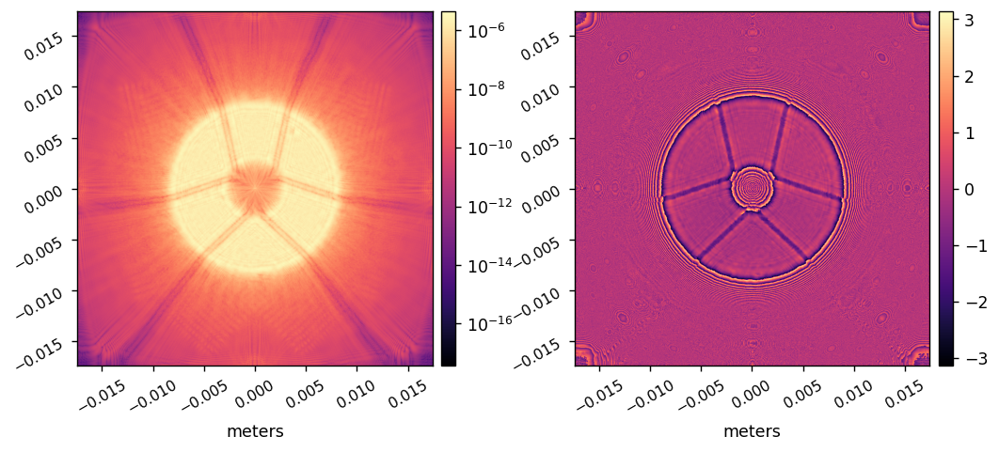

C:\Users\Kian Milani\Desktop\roman-waves\phasec\spc-wide\wf_oap4_proper.fits


In [22]:
proper.prop_propagate( wavefront, d_fold3_oap4, 'OAP4' )
proper.prop_lens( wavefront, fl_oap4 )
if use_errors != 0: 
    map_fname = 'roman_phasec_OAP4_phase_error_V3.0.fits'
    dmap = proper.prop_errormap( wavefront, map_dir+map_fname, WAVEFRONT=True )
    sampling = proper.prop_get_sampling(wavefront)
    dmaphdr = fits.Header(); dmaphdr['PIXELSCL'] = sampling
    dmaphdu = fits.PrimaryHDU(data=dmap, header=dmaphdr)
    dmaphdu.writeto(map_dir_new+map_fname, overwrite=True)
    print(map_dir_new+map_fname, sampling)
if use_aperture != 0: proper.prop_circular_aperture( wavefront, diam_oap4/2.0 )
    
wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
wf_phase = proper.prop_get_phase(wavefront)
wf_sampling = proper.prop_get_sampling(wavefront)

misc.myimshow2(wf_int, wf_phase, pxscl=wf_sampling*u.m/u.pix, lognorm1=True)
if save_waves:
    wf = np.zeros(shape=(2,n,n))
    wf[0,:,:] = wf_int
    wf[1,:,:] = wf_phase

    wf_fname = 'wf_oap4'
    wf_fpath = wf_dir + wf_fname + '_proper' + '.fits'
    print(wf_fpath)
    hdr = fits.Header()
    hdr['PIXELSCL'] = wf_sampling

    wf_hdu = fits.PrimaryHDU(wf, header=hdr)
    wf_hdu.writeto(wf_fpath, overwrite=True)

# Propagate to Pupil Mask Plane.

Propagating to PUPIL_MASK
C:\Users\Kian Milani\Desktop\roman-cgi-phasec-data\spc-wide-opds\roman_phasec_PUPILMASK_phase_error_V1.0.fits 1.7000139742947902e-05


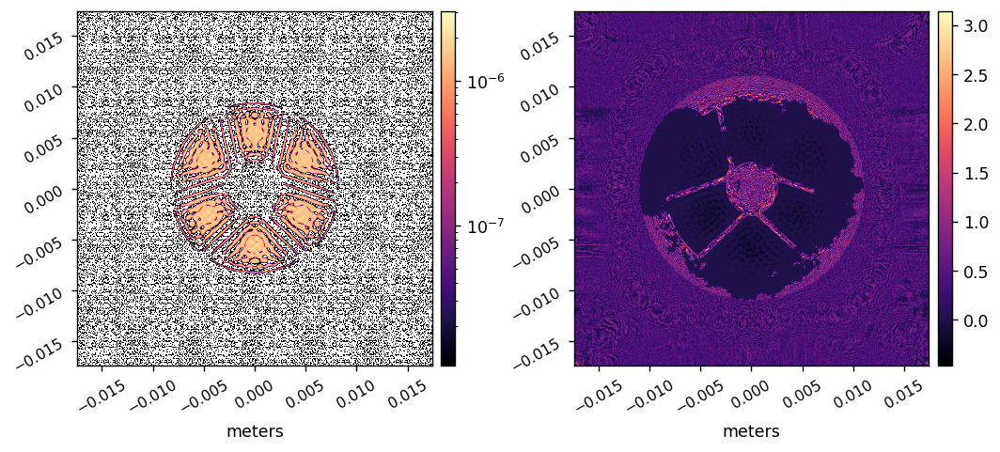

1.7000139742947902e-05
C:\Users\Kian Milani\Desktop\roman-waves\phasec\spc-wide\wf_spm_proper.fits


In [23]:
proper.prop_propagate( wavefront, d_oap4_pupilmask, 'PUPIL_MASK' )    # flat/reflective shaped pupil 
if (is_spc == True or np.isscalar(pupil_mask_array) == False) and use_pupil_mask != 0:
    if np.isscalar(pupil_mask_array): 
        pupil_mask = proper.prop_fits_read( pupil_mask_file )
        pupil_mask = trim( pupil_mask, n )
    else:
        pupil_mask = trim( pupil_mask_array, n )
    if mask_x_shift_pupdiam != 0 or mask_y_shift_pupdiam != 0 or mask_x_shift_m != 0 or mask_y_shift_m != 0:
        # shift SP mask by FFTing it, applying tilt, and FFTing back 
        if mask_x_shift_pupdiam != 0 or mask_y_shift_pupdiam != 0:
            # offsets are normalized to pupil diameter
            xt = -mask_x_shift_pupdiam * pupil_diam_pix * float(pupil_diam_pix)/n
            yt = -mask_y_shift_pupdiam * pupil_diam_pix * float(pupil_diam_pix)/n
        else:
            d_m = proper.prop_get_sampling(wavefront)
            xt = -mask_x_shift_m / d_m * float(pupil_diam_pix)/n
            yt = -mask_y_shift_m / d_m * float(pupil_diam_pix)/n
        x = np.tile( (np.arange(n)-n//2) / (pupil_diam_pix/2.0), (n,1) )
        y = np.transpose(x)
        tilt = complex(0,1) * np.pi * (x*xt + y*yt)
        x = 0
        y = 0
        pupil_mask = ffts( pupil_mask, -1 )
        pupil_mask *= np.exp(tilt)
        pupil_mask = ffts( pupil_mask, 1 )
        pupil_mask = pupil_mask.real
        tilt = 0
    proper.prop_multiply( wavefront, pupil_mask )
    pupil_mask = 0
if use_errors != 0: 
    map_fname = 'roman_phasec_PUPILMASK_phase_error_V1.0.fits'
    dmap = proper.prop_errormap( wavefront, map_dir+map_fname, WAVEFRONT=True )
    sampling = proper.prop_get_sampling(wavefront)
    dmaphdr = fits.Header(); dmaphdr['PIXELSCL'] = sampling
    dmaphdu = fits.PrimaryHDU(data=dmap, header=dmaphdr)
    dmaphdu.writeto(map_dir_new+map_fname, overwrite=True)
    print(map_dir_new+map_fname, sampling)
    
wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
wf_phase = proper.prop_get_phase(wavefront)
wf_sampling = proper.prop_get_sampling(wavefront)

misc.myimshow2(wf_int, wf_phase, pxscl=wf_sampling*u.m/u.pix, lognorm1=True)
print(wf_sampling)
if save_waves:
    wf = np.zeros(shape=(2,n,n))
    wf[0,:,:] = wf_int
    wf[1,:,:] = wf_phase

    wf_fname = 'wf_spm'
    wf_fpath = wf_dir + wf_fname + '_proper' + '.fits'
    print(wf_fpath)
    hdr = fits.Header()
    hdr['PIXELSCL'] = wf_sampling

    wf_hdu = fits.PrimaryHDU(wf, header=hdr)
    wf_hdu.writeto(wf_fpath, overwrite=True)

# Propagate to OAP5.

Propagating to OAP5
Applying lens
C:\Users\Kian Milani\Desktop\roman-cgi-phasec-data\spc-wide-opds\roman_phasec_OAP5_phase_error_V3.0.fits 1.7000139742947902e-05


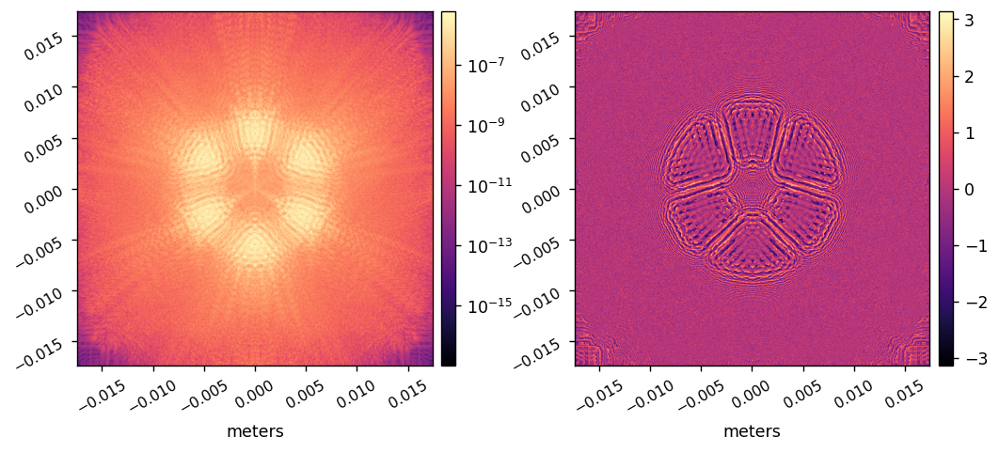

C:\Users\Kian Milani\Desktop\roman-waves\phasec\spc-wide\wf_oap5_proper.fits


In [24]:
proper.prop_propagate( wavefront, d_pupilmask_oap5, 'OAP5' )
proper.prop_lens( wavefront, fl_oap5 )
if use_errors != 0:
    map_fname = 'roman_phasec_OAP5_phase_error_V3.0.fits'
    dmap = proper.prop_errormap( wavefront, map_dir+map_fname, WAVEFRONT=True )
    sampling = proper.prop_get_sampling(wavefront)
    dmaphdr = fits.Header(); dmaphdr['PIXELSCL'] = sampling
    dmaphdu = fits.PrimaryHDU(data=dmap, header=dmaphdr)
    dmaphdu.writeto(map_dir_new+map_fname, overwrite=True)
    print(map_dir_new+map_fname, sampling)
if use_aperture != 0: proper.prop_circular_aperture( wavefront, diam_oap5/2.0 )   
    
wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
wf_phase = proper.prop_get_phase(wavefront)
wf_sampling = proper.prop_get_sampling(wavefront)

misc.myimshow2(wf_int, wf_phase, pxscl=wf_sampling*u.m/u.pix, lognorm1=True)
if save_waves:
    wf = np.zeros(shape=(2,n,n))
    wf[0,:,:] = wf_int
    wf[1,:,:] = wf_phase

    wf_fname = 'wf_oap5'
    wf_fpath = wf_dir + wf_fname + '_proper' + '.fits'
    print(wf_fpath)
    hdr = fits.Header()
    hdr['PIXELSCL'] = wf_sampling

    wf_hdu = fits.PrimaryHDU(wf, header=hdr)
    wf_hdu.writeto(wf_fpath, overwrite=True)

# Propagate to FPM.

Propagating to FPM


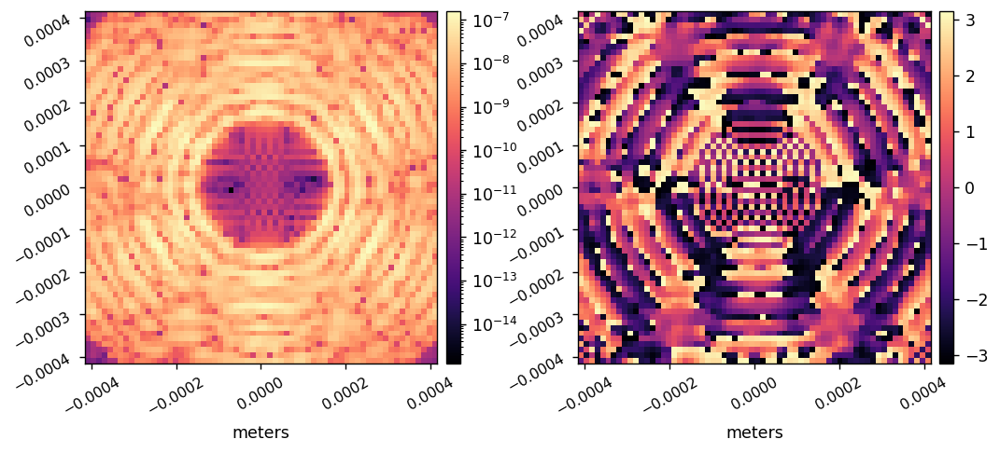

C:\Users\Kian Milani\Desktop\roman-waves\phasec\spc-wide\wf_fpm_proper.fits


In [25]:
proper.prop_propagate( wavefront, d_oap5_fpm+fpm_z_shift_m, 'FPM', TO_PLANE=True )
if use_fpm == 1:
    if is_hlc == True:
        # use MFTs to use super-sampled FPM
        wavefront0 = proper.prop_get_wavefront(wavefront)
        wavefront0 = ffts( wavefront0, 1 )              # to virtual pupil
        wavefront0 *= fpm_array[0,0]                    # apply amplitude & phase from FPM clear area
        nfpm = fpm_array.shape[0]
        fpm_sampling_lamdivD = fpm_sampling_lam0divD * fpm_lam0_m / lambda_m    # FPM sampling at current wavelength in lambda_m/D
        wavefront_fpm = mft2(wavefront0, fpm_sampling_lamdivD, pupil_diam_pix, nfpm, +1)   # MFT to highly-sampled focal plane
        wavefront_fpm *= fpm_mask * (fpm_array - 1)      # subtract field inside FPM region, add in FPM-multiplied region
        wavefront_fpm = mft2(wavefront_fpm, fpm_sampling_lamdivD, pupil_diam_pix, n, -1)        # MFT back to virtual pupil
        wavefront0 += wavefront_fpm
        wavefront_fpm = 0
        wavefront0 = ffts( wavefront0, -1 )     # back to normally-sampled focal plane to continue propagation
        wavefront.wfarr[:,:] = proper.prop_shift_center(wavefront0)
        wavefront0 = 0
    elif is_spc == True:
        # super-sample FPM
        wavefront0 = proper.prop_get_wavefront(wavefront)
        wavefront0 = ffts( wavefront0, 1 )                # to virtual pupil
        wavefront0 = trim(wavefront0, n_mft)
        if np.isscalar(fpm_array):
            fpm_array = proper.prop_fits_read( fpm_file )
            fpm_sampling_lamdivD = fpm_sampling_lam0divD * fpm_lam0_m / lambda_m     # FPM sampling at current wavelength in lam/D
        else:
            m_per_lamdivD = proper.prop_get_sampling(wavefront) / (pupil_diam_pix / n)
            fpm_sampling_lamdivD = fpm_array_sampling_m / m_per_lamdivD
        nfpm = fpm_array.shape[1]
        wavefront0 = mft2(wavefront0, fpm_sampling_lamdivD, pupil_diam_pix, nfpm, +1)   # MFT to highly-sampled focal plane
        wavefront0 *= fpm_array
        wavefront0 = mft2(wavefront0, fpm_sampling_lamdivD, pupil_diam_pix, n, -1)  # MFT to virtual pupil 
        wavefront0 = ffts( wavefront0, -1 )    # back to normally-sampled focal plane
        wavefront.wfarr[:,:] = proper.prop_shift_center(wavefront0)
        wavefront0 = 0

wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
wf_phase = proper.prop_get_phase(wavefront)
wf_sampling = proper.prop_get_sampling(wavefront)

misc.myimshow2(wf_int, wf_phase, pxscl=wf_sampling*u.m/u.pix, npix=64, lognorm1=True)
if save_waves:
    wf = np.zeros(shape=(2,n,n))
    wf[0,:,:] = wf_int
    wf[1,:,:] = wf_phase

    wf_fname = 'wf_fpm'
    wf_fpath = wf_dir + wf_fname + '_proper' + '.fits'
    print(wf_fpath)
    hdr = fits.Header()
    hdr['PIXELSCL'] = wf_sampling

    wf_hdu = fits.PrimaryHDU(wf, header=hdr)
    wf_hdu.writeto(wf_fpath, overwrite=True)

# Propagate to OAP6.

Propagating to OAP6
Applying lens
C:\Users\Kian Milani\Desktop\roman-cgi-phasec-data\spc-wide-opds\roman_phasec_OAP6_phase_error_V3.0.fits 1.6998849063360116e-05


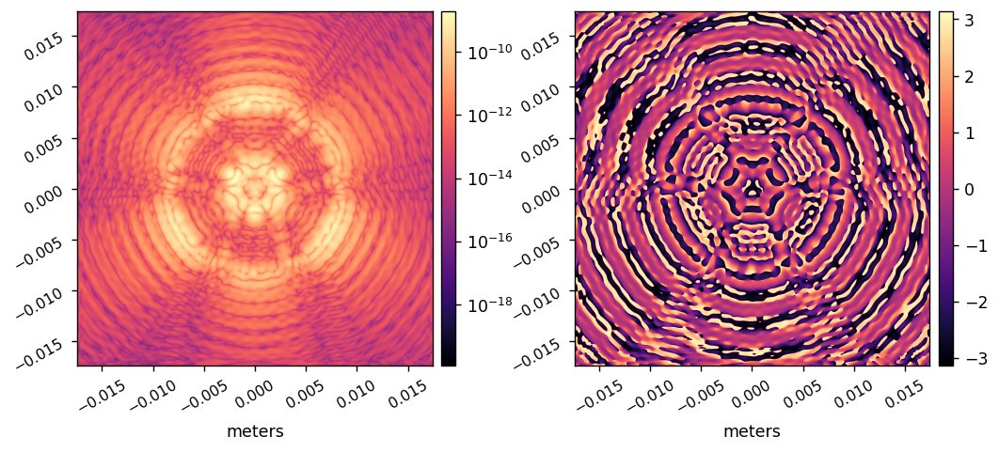

C:\Users\Kian Milani\Desktop\roman-waves\phasec\spc-wide\wf_oap6_proper.fits


In [26]:
proper.prop_propagate( wavefront, d_fpm_oap6-fpm_z_shift_m, 'OAP6' )
proper.prop_lens( wavefront, fl_oap6 )
if use_errors != 0 and end_at_fpm_exit_pupil == 0: 
    map_fname = 'roman_phasec_OAP6_phase_error_V3.0.fits'
    dmap = proper.prop_errormap( wavefront, map_dir+map_fname, WAVEFRONT=True )
    sampling = proper.prop_get_sampling(wavefront)
    dmaphdr = fits.Header(); dmaphdr['PIXELSCL'] = sampling
    dmaphdu = fits.PrimaryHDU(data=dmap, header=dmaphdr)
    dmaphdu.writeto(map_dir_new+map_fname, overwrite=True)
    print(map_dir_new+map_fname, sampling)
if use_aperture != 0 or pinhole_diam_m != 0: proper.prop_circular_aperture( wavefront, diam_oap6/2.0 )  
    
wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
wf_phase = proper.prop_get_phase(wavefront)
wf_sampling = proper.prop_get_sampling(wavefront)

misc.myimshow2(wf_int, wf_phase, pxscl=wf_sampling*u.m/u.pix, lognorm1=True)
if save_waves:
    wf = np.zeros(shape=(2,n,n))
    wf[0,:,:] = wf_int
    wf[1,:,:] = wf_phase

    wf_fname = 'wf_oap6'
    wf_fpath = wf_dir + wf_fname + '_proper' + '.fits'
    print(wf_fpath)
    hdr = fits.Header()
    hdr['PIXELSCL'] = wf_sampling

    wf_hdu = fits.PrimaryHDU(wf, header=hdr)
    wf_hdu.writeto(wf_fpath, overwrite=True)

# Propagate to Lyot Stop.

Propagating to LYOT STOP


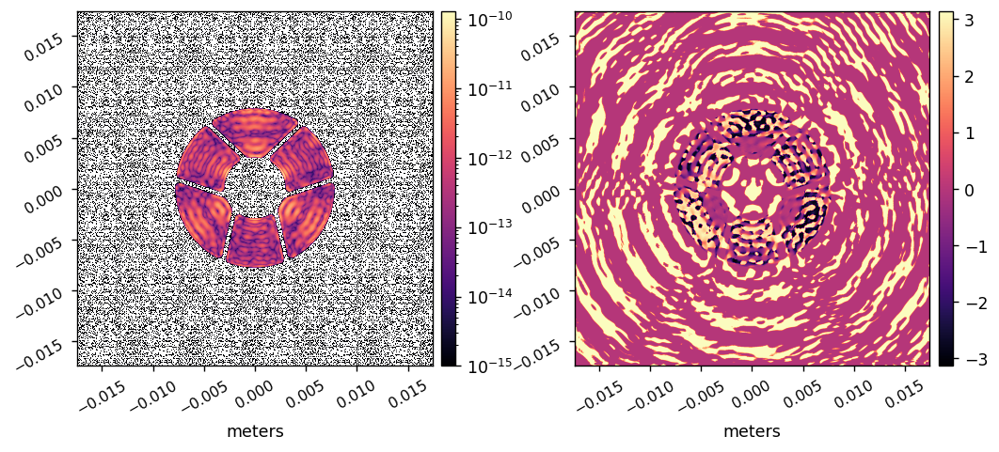

1.6998849063360116e-05
C:\Users\Kian Milani\Desktop\roman-waves\phasec\spc-wide\wf_lyotstop_proper.fits


In [27]:
proper.prop_propagate( wavefront, d_oap6_lyotstop, 'LYOT STOP' )
if use_lyot_stop != 0:
    if np.isscalar(lyot_stop_array):
        lyot = proper.prop_fits_read( lyot_stop_file )
        lyot = trim( lyot, n )
    else:
        lyot = trim( lyot_stop_array, n )
    if lyot_x_shift_pupdiam != 0 or lyot_y_shift_pupdiam != 0 or lyot_x_shift_m != 0 or lyot_y_shift_m != 0:
        # apply shift to lyot stop by FFTing the stop, applying a tilt, and FFTing back
        if lyot_x_shift_pupdiam != 0 or lyot_y_shift_pupdiam != 0:
            # offsets are normalized to pupil diameter
            xt = -lyot_x_shift_pupdiam * pupil_diam_pix * float(pupil_diam_pix)/n
            yt = -lyot_y_shift_pupdiam * pupil_diam_pix * float(pupil_diam_pix)/n
        else:
            d_m = proper.prop_get_sampling(wavefront)
            xt = -lyot_x_shift_m / d_m * float(pupil_diam_pix)/n
            yt = -lyot_y_shift_m / d_m * float(pupil_diam_pix)/n
        x = np.tile( (np.arange(n)-n//2) / (pupil_diam_pix/2.0), (n,1) )
        y = np.transpose(x)
        tilt = complex(0,1) * np.pi * (x*xt + y*yt)
        x = 0
        y = 0
        lyot = ffts(lyot,-1)
        lyot *= np.exp(tilt)
        lyot = ffts( lyot, 1 )
        lyot = lyot.real
        tilt = 0
    proper.prop_multiply( wavefront, lyot )
    lyot = 0
if use_pupil_lens != 0 or pinhole_diam_m != 0: proper.prop_circular_aperture( wavefront, 1.079, NORM=True )
    
wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
wf_phase = proper.prop_get_phase(wavefront)
wf_sampling = proper.prop_get_sampling(wavefront)

misc.myimshow2(wf_int, wf_phase, pxscl=wf_sampling*u.m/u.pix, lognorm1=True, vmin1=1e-15)
print(wf_sampling)
if save_waves:
    wf = np.zeros(shape=(2,n,n))
    wf[0,:,:] = wf_int
    wf[1,:,:] = wf_phase

    wf_fname = 'wf_lyotstop'
    wf_fpath = wf_dir + wf_fname + '_proper' + '.fits'
    print(wf_fpath)
    hdr = fits.Header()
    hdr['PIXELSCL'] = wf_sampling

    wf_hdu = fits.PrimaryHDU(wf, header=hdr)
    wf_hdu.writeto(wf_fpath, overwrite=True)

# Propagate to OAP7.

Propagating to OAP7
Applying lens
C:\Users\Kian Milani\Desktop\roman-cgi-phasec-data\spc-wide-opds\roman_phasec_OAP7_phase_error_V3.0.fits 1.6998849063360116e-05


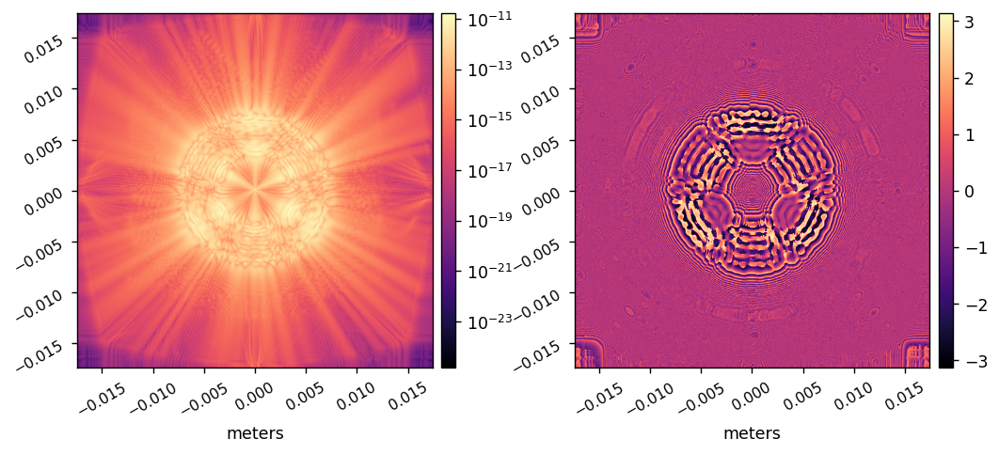

C:\Users\Kian Milani\Desktop\roman-waves\phasec\spc-wide\wf_oap7_proper.fits


In [28]:
proper.prop_propagate( wavefront, d_lyotstop_oap7, 'OAP7' )
proper.prop_lens( wavefront, fl_oap7 )
if use_errors != 0: 
    map_fname = 'roman_phasec_OAP7_phase_error_V3.0.fits'
    dmap = proper.prop_errormap( wavefront, map_dir+map_fname, WAVEFRONT=True )
    sampling = proper.prop_get_sampling(wavefront)
    dmaphdr = fits.Header(); dmaphdr['PIXELSCL'] = sampling
    dmaphdu = fits.PrimaryHDU(data=dmap, header=dmaphdr)
    dmaphdu.writeto(map_dir_new+map_fname, overwrite=True)
    print(map_dir_new+map_fname, sampling)
if use_aperture != 0: proper.prop_circular_aperture( wavefront, diam_oap7/2.0 )  
    
wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
wf_phase = proper.prop_get_phase(wavefront)
wf_sampling = proper.prop_get_sampling(wavefront)

misc.myimshow2(wf_int, wf_phase, pxscl=wf_sampling*u.m/u.pix, lognorm1=True)
if save_waves:
    wf = np.zeros(shape=(2,n,n))
    wf[0,:,:] = wf_int
    wf[1,:,:] = wf_phase

    wf_fname = 'wf_oap7'
    wf_fpath = wf_dir + wf_fname + '_proper' + '.fits'
    print(wf_fpath)
    hdr = fits.Header()
    hdr['PIXELSCL'] = wf_sampling

    wf_hdu = fits.PrimaryHDU(wf, header=hdr)
    wf_hdu.writeto(wf_fpath, overwrite=True)

# Propagate to Field Stop.

Propagating to FIELD_STOP


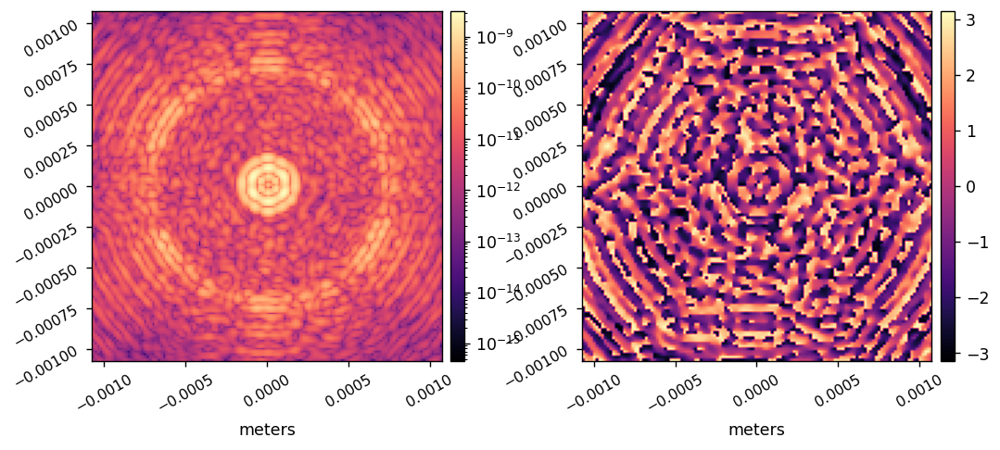

C:\Users\Kian Milani\Desktop\roman-waves\phasec\spc-wide\wf_fieldstop_proper.fits


In [29]:
proper.prop_propagate( wavefront, d_oap7_fieldstop, 'FIELD_STOP' )
cor_type='spc-spec_band3'
if np.isscalar(field_stop_array):
    if use_field_stop != 0 and cor_type == 'hlc':
        sampling_lamD = float(pupil_diam_pix) / n      # sampling at focus in lambda_m/D
        stop_radius = field_stop_radius_lam0 / sampling_lamD * (lambda0_m/lambda_m) * proper.prop_get_sampling(wavefront)
        if field_stop_x_offset != 0 or field_stop_y_offset != 0:
            # convert offsets in lambda0/D to meters
            x_offset_lamD = field_stop_x_offset * lambda0_m / lambda_m
            y_offset_lamD = field_stop_y_offset * lambda0_m / lambda_m
            pupil_ratio = float(pupil_diam_pix) / n
            field_stop_x_offset_m = x_offset_lamD / pupil_ratio * proper.prop_get_sampling(wavefront)
            field_stop_y_offset_m = y_offset_lamD / pupil_ratio * proper.prop_get_sampling(wavefront)
        proper.prop_circular_aperture( wavefront, stop_radius, -field_stop_x_offset_m, -field_stop_y_offset_m )
else:
    wavefront0 = proper.prop_get_wavefront(wavefront)
    wavefront0 = ffts( wavefront0, 1 )                # to virtual pupil
    wavefront0 = trim(wavefront0, n_mft)
    m_per_lamdivD = proper.prop_get_sampling(wavefront) / (pupil_diam_pix / n)
    field_stop_sampling_lamdivD = field_stop_array_sampling_m / m_per_lamdivD
    nstop = field_stop_array.shape[1]
    wavefront0 = mft2(wavefront0, field_stop_sampling_lamdivD, pupil_diam_pix, nstop, 1)   # MFT to highly-sampled focal plane
    wavefront0 *= field_stop_array
    wavefront0 = mft2(wavefront0, field_stop_sampling_lamdivD, pupil_diam_pix, n, -1)  # MFT to virtual pupil 
    wavefront0 = ffts( wavefront0, -1 )    # back to normally-sampled focal plane
    wavefront.wfarr[:,:] = proper.prop_shift_center(wavefront0)
    
wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
wf_phase = proper.prop_get_phase(wavefront)
wf_sampling = proper.prop_get_sampling(wavefront)

misc.myimshow2(wf_int, wf_phase, pxscl=wf_sampling*u.m/u.pix, npix=128, lognorm1=True)
if save_waves:
    wf = np.zeros(shape=(2,n,n))
    wf[0,:,:] = wf_int
    wf[1,:,:] = wf_phase

    wf_fname = 'wf_fieldstop'
    wf_fpath = wf_dir + wf_fname + '_proper' + '.fits'
    print(wf_fpath)
    hdr = fits.Header()
    hdr['PIXELSCL'] = wf_sampling

    wf_hdu = fits.PrimaryHDU(wf, header=hdr)
    wf_hdu.writeto(wf_fpath, overwrite=True)

# Propagate to OAP8.

Propagating to OAP8
Applying lens
C:\Users\Kian Milani\Desktop\roman-cgi-phasec-data\spc-wide-opds\roman_phasec_OAP8_phase_error_V3.0.fits 5.052053966631142e-06


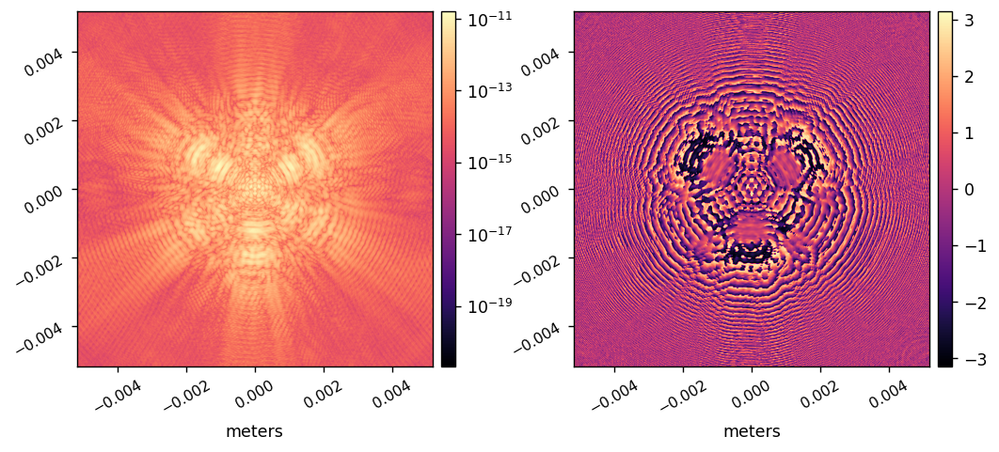

C:\Users\Kian Milani\Desktop\roman-waves\phasec\spc-wide\wf_oap8_proper.fits


In [30]:
proper.prop_propagate( wavefront, d_fieldstop_oap8, 'OAP8' )
proper.prop_lens( wavefront, fl_oap8 )
if use_errors != 0: 
    map_fname = 'roman_phasec_OAP8_phase_error_V3.0.fits'
    dmap = proper.prop_errormap( wavefront, map_dir+map_fname, WAVEFRONT=True )
    sampling = proper.prop_get_sampling(wavefront)
    dmaphdr = fits.Header(); dmaphdr['PIXELSCL'] = sampling
    dmaphdu = fits.PrimaryHDU(data=dmap, header=dmaphdr)
    dmaphdu.writeto(map_dir_new+map_fname, overwrite=True)
    print(map_dir_new+map_fname, sampling)
if use_aperture != 0: proper.prop_circular_aperture( wavefront, diam_oap8/2.0 )  
    
wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
wf_phase = proper.prop_get_phase(wavefront)
wf_sampling = proper.prop_get_sampling(wavefront)

misc.myimshow2(wf_int, wf_phase, pxscl=wf_sampling*u.m/u.pix, lognorm1=True)
if save_waves:
    wf = np.zeros(shape=(2,n,n))
    wf[0,:,:] = wf_int
    wf[1,:,:] = wf_phase

    wf_fname = 'wf_oap8'
    wf_fpath = wf_dir + wf_fname + '_proper' + '.fits'
    print(wf_fpath)
    hdr = fits.Header()
    hdr['PIXELSCL'] = wf_sampling

    wf_hdu = fits.PrimaryHDU(wf, header=hdr)
    wf_hdu.writeto(wf_fpath, overwrite=True)

# Propagate to filter.

Propagating to filter
C:\Users\Kian Milani\Desktop\roman-cgi-phasec-data\spc-wide-opds\roman_phasec_FILTER_phase_error_V1.0.fits 5.052053966631142e-06


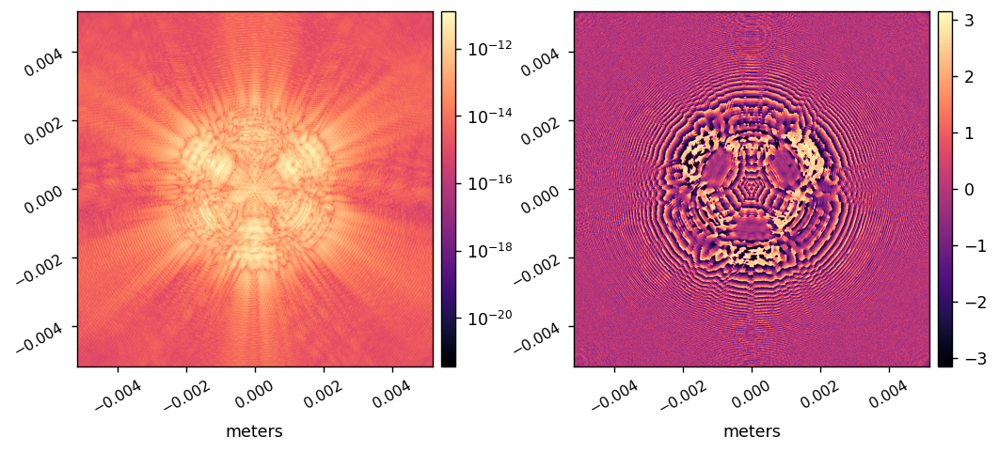

C:\Users\Kian Milani\Desktop\roman-waves\phasec\spc-wide\wf_filter_proper.fits


In [31]:
proper.prop_propagate( wavefront, d_oap8_filter, 'filter' )
if use_errors != 0:
    map_fname = 'roman_phasec_FILTER_phase_error_V1.0.fits'
    dmap = proper.prop_errormap( wavefront, map_dir+map_fname, WAVEFRONT=True )
    sampling = proper.prop_get_sampling(wavefront)
    dmaphdr = fits.Header(); dmaphdr['PIXELSCL'] = sampling
    dmaphdu = fits.PrimaryHDU(data=dmap, header=dmaphdr)
    dmaphdu.writeto(map_dir_new+map_fname, overwrite=True)
    print(map_dir_new+map_fname, sampling)
if use_aperture != 0: proper.prop_circular_aperture( wavefront, diam_filter/2.0 )
    
wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
wf_phase = proper.prop_get_phase(wavefront)
wf_sampling = proper.prop_get_sampling(wavefront)

misc.myimshow2(wf_int, wf_phase, pxscl=wf_sampling*u.m/u.pix, lognorm1=True)
if save_waves:
    wf = np.zeros(shape=(2,n,n))
    wf[0,:,:] = wf_int
    wf[1,:,:] = wf_phase

    wf_fname = 'wf_filter'
    wf_fpath = wf_dir + wf_fname + '_proper' + '.fits'
    print(wf_fpath)
    hdr = fits.Header()
    hdr['PIXELSCL'] = wf_sampling

    wf_hdu = fits.PrimaryHDU(wf, header=hdr)
    wf_hdu.writeto(wf_fpath, overwrite=True)

# Propagate to Lens for imaging.

0.10634603992822719 0.000998177872293641 -0.000998177872293641
-0.1745980157558932 0.0015551240508423657 1.6497346586129525e-14
0.21434365249697815 0.0030533019231360065 0.25243230860876464
Propagating to IMAGING LENS
Applying lens at IMAGING LENS lens #1
C:\Users\Kian Milani\Desktop\roman-cgi-phasec-data\spc-wide-opds\roman_phasec_LENS_phase_error_V1.0.fits 5.052053966631142e-06


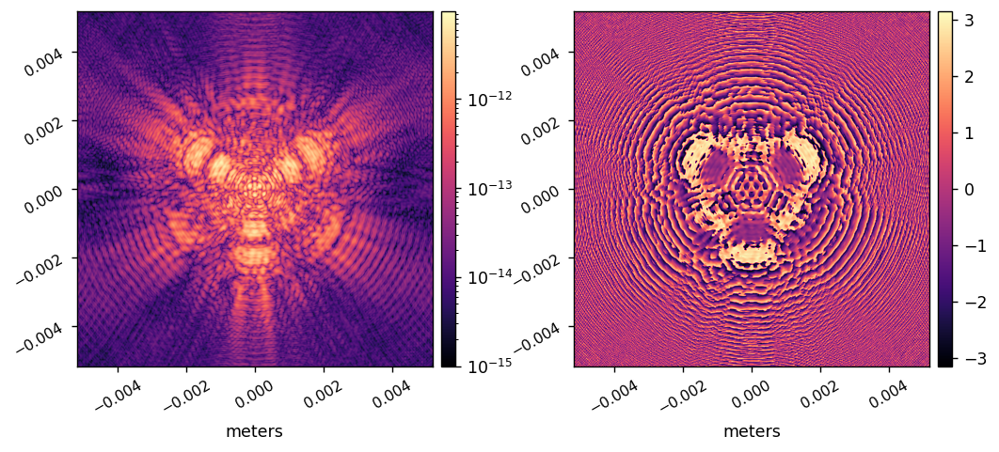

C:\Users\Kian Milani\Desktop\roman-waves\phasec\spc-wide\wf_lens1_proper.fits
Propagating
Applying lens at IMAGING LENS lens #2


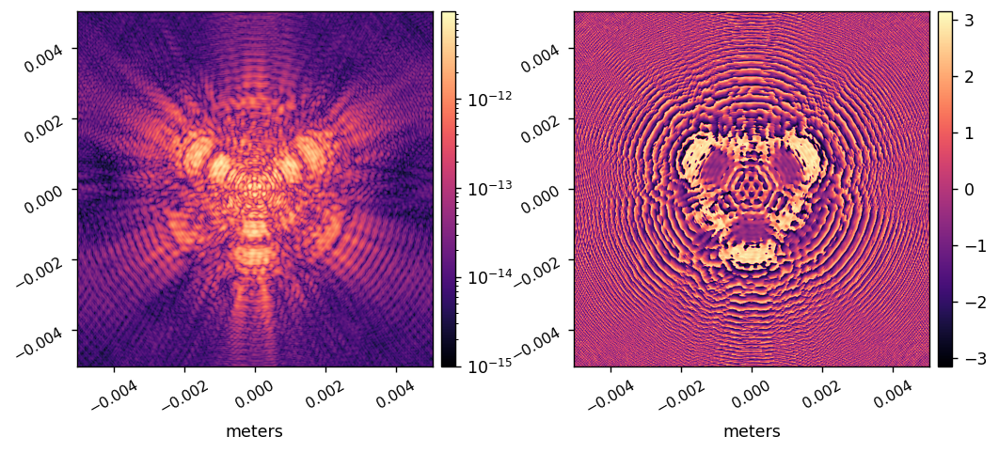

C:\Users\Kian Milani\Desktop\roman-waves\phasec\spc-wide\wf_lens2_proper.fits
Propagating to IMAGE


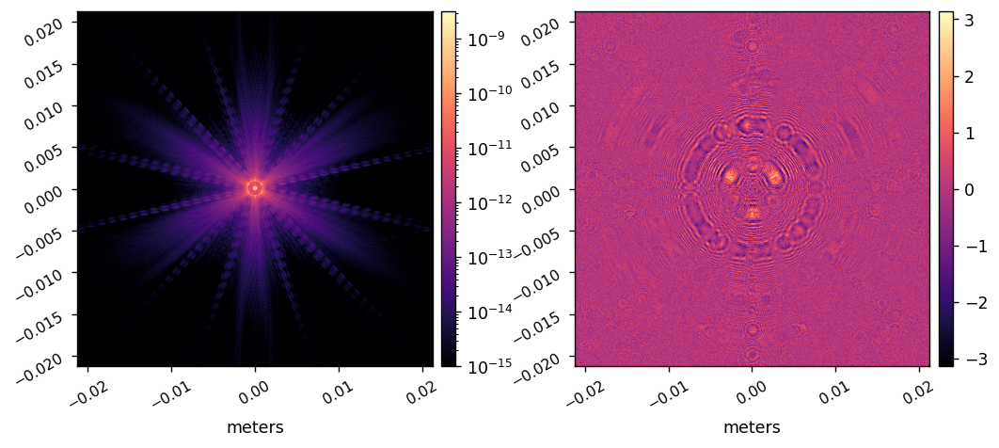

C:\Users\Kian Milani\Desktop\roman-waves\phasec\spc-wide\wf_image_proper.fits


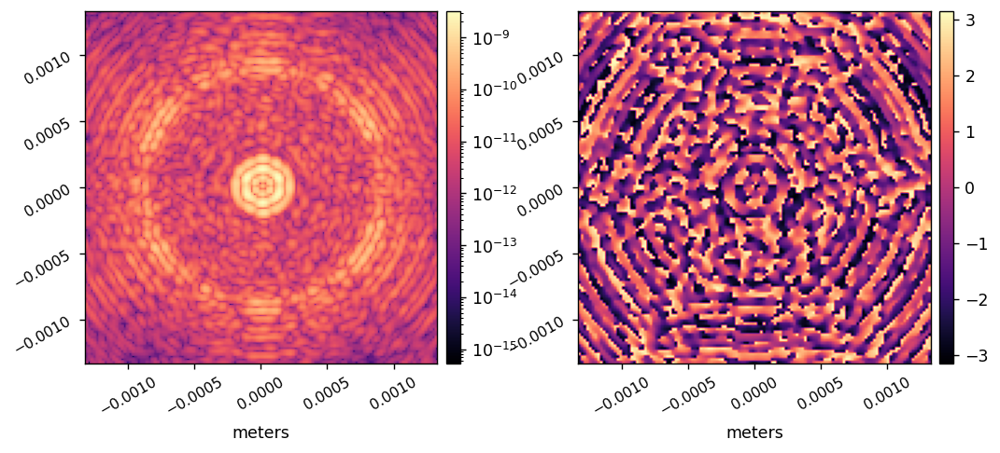

In [32]:
# propagate to lens, apply lens, then propagate to detector
if use_pupil_lens == 0 and use_defocus_lens == 0:
    # use imaging lens to create normal focus
    if use_errors != 0:
        imaging_lens_error_file = map_dir + 'roman_phasec_LENS_phase_error_V1.0.fits'
    else:
        imaging_lens_error_file = ' '
    to_from_doublet( wavefront, d_filter_lens, d_lens_fold4+d_fold4_image, 
            0.10792660718579995, -0.10792660718579995, 0.003, glass_index('S-BSL7R', lambda_m, data_dir), 0.0005, 
            1e10, 0.10608379812011390, 0.0025, glass_index('PBM2R', lambda_m, data_dir), 
            'IMAGING LENS', 'IMAGE', ERROR_MAP_FILE=imaging_lens_error_file, TO_PLANE=1, save_waves=save_waves)
elif use_pupil_lens != 0:
    # use pupil imaging lens
    if use_errors != 0:
        pupil_lens_error_file = map_dir + 'roman_phasec_PUPILLENS_phase_error_V1.0.fits'
    else:
        pupil_lens_error_file = ' '
    to_from_doublet( wavefront, d_filter_lens, d_lens_fold4+d_fold4_image, 
            0.03449714, -0.20846556, 0.003, glass_index('S-BSL7R', lambda_m, data_dir), 0.0007, 
            1e10, 0.05453792, 0.0025, glass_index('PBM2R', lambda_m, data_dir), 
            'PUPIL IMAGING LENS', 'IMAGE', ERROR_MAP_FILE=pupil_lens_error_file, TO_PLANE=0 )
elif use_defocus_lens != 0:     
    # use one of 4 defocusing lenses
    c_lens = [0.01325908247149297, 0.01243982235933671, 0.01163480668768688, 0.005663476241717166]
    if use_errors != 0:
        defocus_lens_error_file = map_dir+'roman_phasec_DEFOCUSLENS' + str(use_defocus_lens) + '_phase_error_V1.0.fits'
    else:
        defocus_lens_error_file = ' '
    to_from_singlet( wavefront, d_filter_lens, d_lens_fold4+d_fold4_image, 
             0.001 / c_lens[use_defocus_lens-1], 1e10, 0.005, glass_index('SILICA', lambda_m, data_dir), 
            'DEFOCUS LENS', 'IMAGE', ERROR_MAP_FILE=defocus_lens_error_file, TO_PLANE=(use_defocus_lens == 3 or use_defocus_lens == 4) )

if end_at_exit_pupil != 0:
    # create a sharp pupil image
    proper.prop_propagate( wavefront, 0.1 )
    proper.prop_lens( wavefront, 0.1 )
    proper.prop_propagate( wavefront, 0.0882 )
elif use_defocus_lens == 0 and use_pupil_lens == 0:
    rsqr = proper.prop_radius( wavefront )**2 

(wavefront, sampling_m) = proper.prop_end( wavefront, NOABS=True )
    
wf_int = np.abs(wavefront)**2
wf_phase = np.angle(wavefront)
wf_sampling = sampling_m

misc.myimshow2(wf_int, wf_phase, pxscl=wf_sampling*u.m/u.pix, npix=128, lognorm1=True)

# Propagation is done, now obtain the final wavefront and adjust sampling as necessary. 

<ipython-input-33-d11f9dc9648e>:3: DeprecationWarning: `np.complex` is a deprecated alias for the builtin `complex`. To silence this warning, use `complex` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.complex128` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  wavefront *= np.exp((np.complex(0,1) * 16 * np.pi / lambda_m * 0.0735) * rsqr)


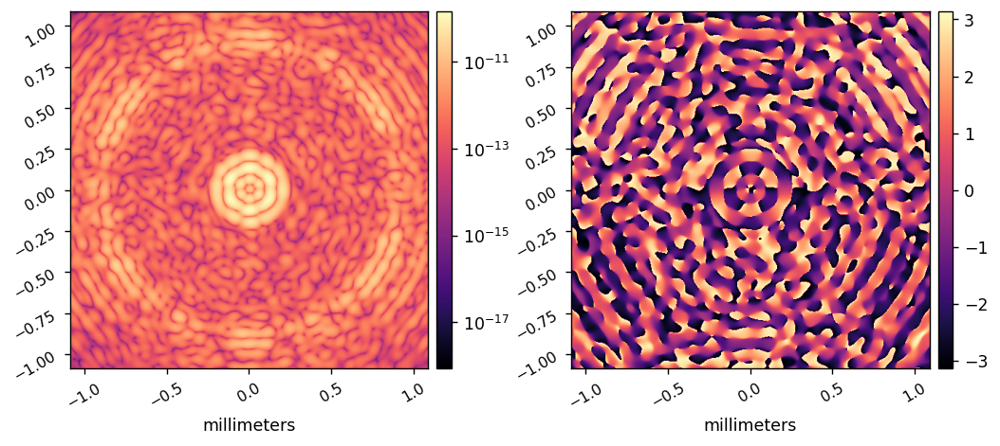

C:\Users\Kian Milani\Desktop\roman-waves\phasec\spc-wide\wf_image_post_proper.fits


In [33]:
# remove phase term due to pupil not at front focus of lens (only in direct imaging mode) 
if use_defocus_lens == 0 and use_pupil_lens == 0 and end_at_exit_pupil == 0:
    wavefront *= np.exp((np.complex(0,1) * 16 * np.pi / lambda_m * 0.0735) * rsqr)

# resample as needed
if final_sampling_m != 0:
    mag = sampling_m / final_sampling_m
    sampling_m = final_sampling_m 
    wavefront = proper.prop_magnify( wavefront, mag, output_dim, AMP_CONSERVE=True )
elif final_sampling_lam0 != 0:
    if use_pupil_lens != 0 or use_defocus_lens != 0 or end_at_exit_pupil != 0:
        raise Exception('ERROR: Cannot specify final_sampling_lam0 when using pupil or defocus lens or ending at exit pupil.')
    else:
        mag = (float(pupil_diam_pix)/n) / final_sampling_lam0 * (lambda_m/lambda0_m)
        sampling_m = sampling_m / mag
        wavefront = proper.prop_magnify( wavefront, mag, output_dim, AMP_CONSERVE=True )
else:
    wavefront = trim(wavefront, output_dim)

wf_int = np.abs(wavefront)**2
wf_phase = np.angle(wavefront)
wf_sampling = sampling_m

misc.myimshow2(wf_int, wf_phase, pxscl=wf_sampling*1000*u.mm/u.pix, lognorm1=True)
if save_waves:
    n = wavefront.shape[0]
    wf = np.zeros(shape=(2,n,n))
    wf[0,:,:] = np.abs(wavefront)**2
    wf[1,:,:] = np.angle(wavefront)

    wf_fname = 'wf_image_post'
    wf_fpath = wf_dir + wf_fname + '_proper' + '.fits'
    print(wf_fpath)
    hdr = fits.Header()
    hdr['PIXELSCL'] = wf_sampling

    wf_hdu = fits.PrimaryHDU(wf, header=hdr)
    wf_hdu.writeto(wf_fpath, overwrite=True)

# Test the actual model for consistency.

4.252458802590218e-06 m / pix


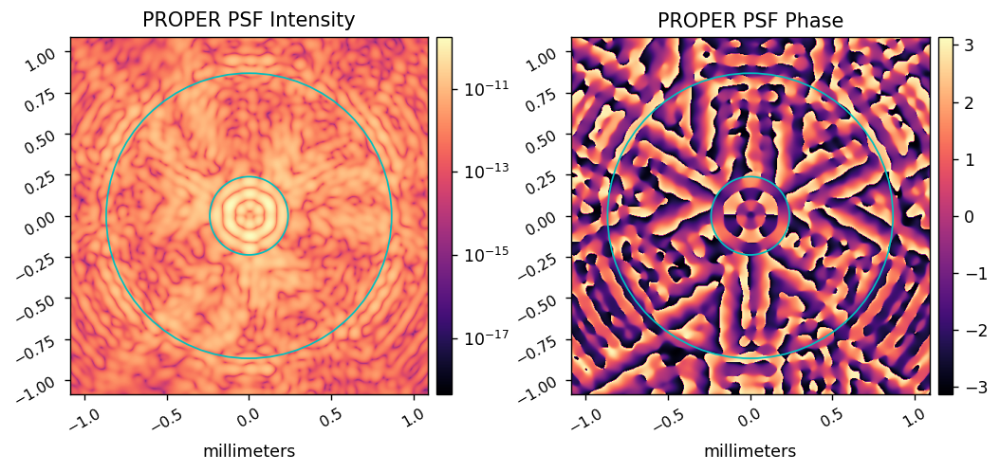

In [2]:
from matplotlib.patches import Circle

lam_array = np.array([0.825])

n = 512                 # output image dimension (must be power of 2)
final_sampling = 0.1    # output sampling in lam0/D

xoffset = 0
use_fpm = 1

use_errors = 0
use_dm1 = 0
use_dm2 = 0
if use_dm1==0: dm1 = 0
else: dm1 = proper.prop_fits_read( roman_phasec_proper.lib_dir + '\\examples\\spc_wide_band4_best_contrast_dm1.fits' )
if use_dm2==0: dm2 = 0
else: dm2 = proper.prop_fits_read( roman_phasec_proper.lib_dir + '\\examples\\spc_wide_band4_best_contrast_dm2.fits' )
polaxis = 0

(wfs, wfs_sampling_m) = proper.prop_run_multi('roman_phasec', lam_array, n, QUIET=False, 
                                                PASSVALUE={'cor_type':'spc-wide',
                                                           'final_sampling_lam0':final_sampling, 
                                                           'source_x_offset':xoffset,
                                                           'use_fpm':use_fpm,
                                                           'use_errors': use_errors,
                                                           'use_dm1':use_dm1, 'dm1_m':dm1, 
                                                           'use_dm2':use_dm2, 'dm2_m':dm2,
                                                           'polaxis':polaxis,
                                                          })
# psfs = np.abs(wfs)**2
# psf = np.sum( psfs, 0 ) / nlam

psf = wfs[0]
psf_sampling_m = wfs_sampling_m[0]*u.m/u.pix

innwa = 5.6/final_sampling*psf_sampling_m.value * 1000 # inner and outer working angles in units of m
outwa = 20.4/final_sampling*psf_sampling_m.value * 1000
patches1 = [Circle((0,0),innwa,edgecolor='c', facecolor='none',lw=1),
            Circle((0,0),outwa,edgecolor='c', facecolor='none',lw=1)]
patches2 = [Circle((0,0),innwa,edgecolor='c', facecolor='none',lw=1),
            Circle((0,0),outwa,edgecolor='c', facecolor='none',lw=1)]
print(psf_sampling_m)
misc.myimshow2(np.abs(psf)**2, np.angle(wfs[0]),
               'PROPER PSF Intensity', 'PROPER PSF Phase',
               pxscl=psf_sampling_m.to(u.mm/u.pix),
               lognorm1=True,
               patches1=patches1, patches2=patches2)# Test the actual model for consistency.

0.0 m / pix


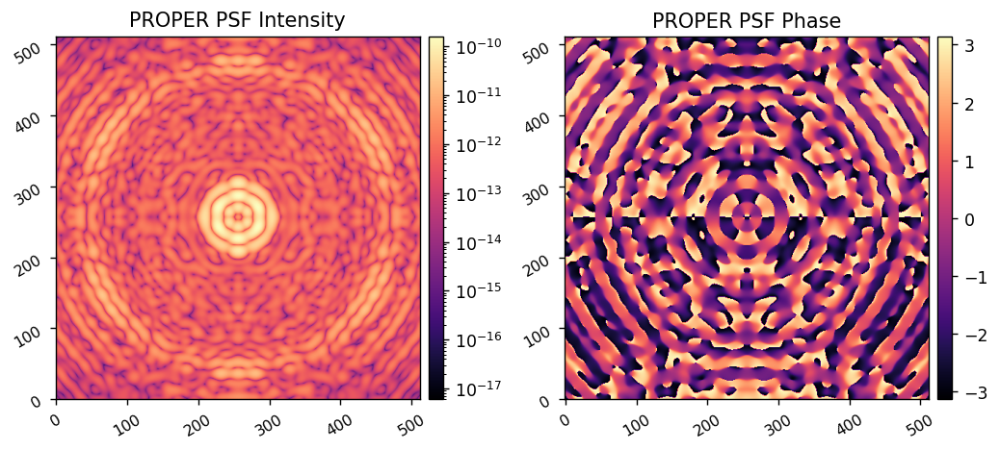

In [35]:
from matplotlib.patches import Circle

lam_array = np.array([0.825])

n = 512                 # output image dimension (must be power of 2)
final_sampling = 0.1    # output sampling in lam0/D

xoffset = 0
use_fpm = 1

use_dm1 = 0
use_dm2 = 0
dm1 = proper.prop_fits_read( roman_phasec_proper.lib_dir + '\\examples\\hlc_best_contrast_dm1.fits' )
dm2 = proper.prop_fits_read( roman_phasec_proper.lib_dir + '\\examples\\hlc_best_contrast_dm2.fits' )
polaxis = 0

(wfs, wfs_sampling_m) = proper.prop_run_multi('roman_phasec_compact', lam_array, n, QUIET=False, 
                                                PASSVALUE={'cor_type':'spc-wide',
                                                           'final_sampling_lam0':final_sampling, 
                                                           'source_x_offset':xoffset,
                                                           'use_fpm':use_fpm,
                                                           'use_dm1':use_dm1, 'dm1_m':dm1, 
                                                           'use_dm2':use_dm2, 'dm2_m':dm2,
                                                           'polaxis':polaxis,
                                                          })
psf = wfs[0]
psf_sampling_m = wfs_sampling_m[0]*u.m/u.pix

print(psf_sampling_m)
misc.myimshow2(np.abs(psf)**2, np.angle(wfs[0]),
               'PROPER PSF Intensity', 'PROPER PSF Phase',
               lognorm1=True)